In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import igraph

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, fontsize=20, figsize=[10,10], facecolor='white')

scanpy==1.7.0 anndata==0.7.5 umap==0.5.1 numpy==1.20.1 scipy==1.5.3 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [3]:
results_file = 'write/210323_analysis.h5ad' 

In [4]:
adata = sc.read_h5ad('write/210323.h5ad')
adata

AnnData object with n_obs × n_vars = 8058 × 18658
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'doublet_info_colors'

In [5]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
adata.raw = adata
adata

normalizing by total count per cell
/home/analysis/miniconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


AnnData object with n_obs × n_vars = 8058 × 18658
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'doublet_info_colors', 'log1p'

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Highly variable genes: 2420


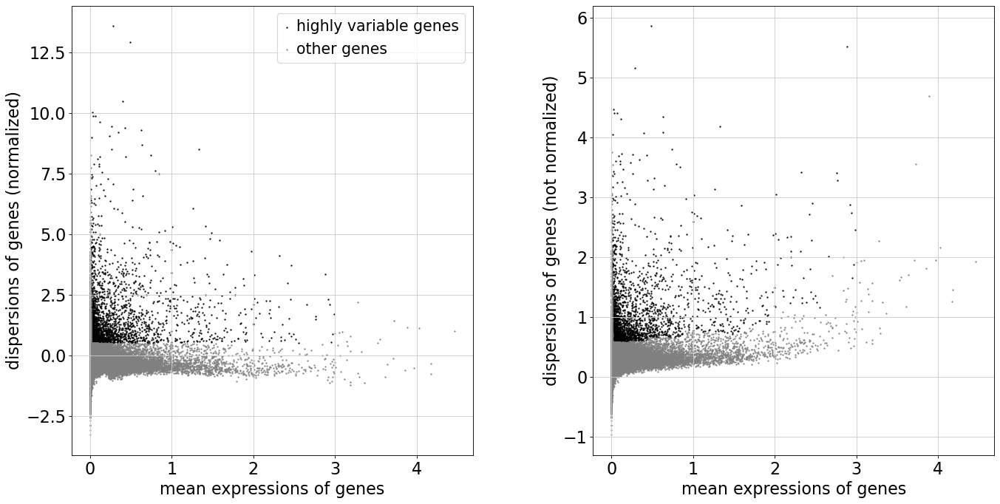

In [6]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
print("Highly variable genes: %d"%sum(adata.var.highly_variable))

sc.pl.highly_variable_genes(adata)

In [7]:
adata = adata[:, adata.var['highly_variable']]

/home/analysis/miniconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [8]:
adata

View of AnnData object with n_obs × n_vars = 8058 × 2420
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_scores', 'predicted_doublets', 'doublet_info'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'doublet_info_colors', 'log1p', 'hvg'

In [9]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb'])

regressing out ['total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb']
    sparse input is densified and may lead to high memory use
    finished (0:00:17)


In [10]:
sc.pp.scale(adata, max_value=10)

In [11]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
/home/analysis/miniconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    with n_comps=50
    finished (0:00:00)


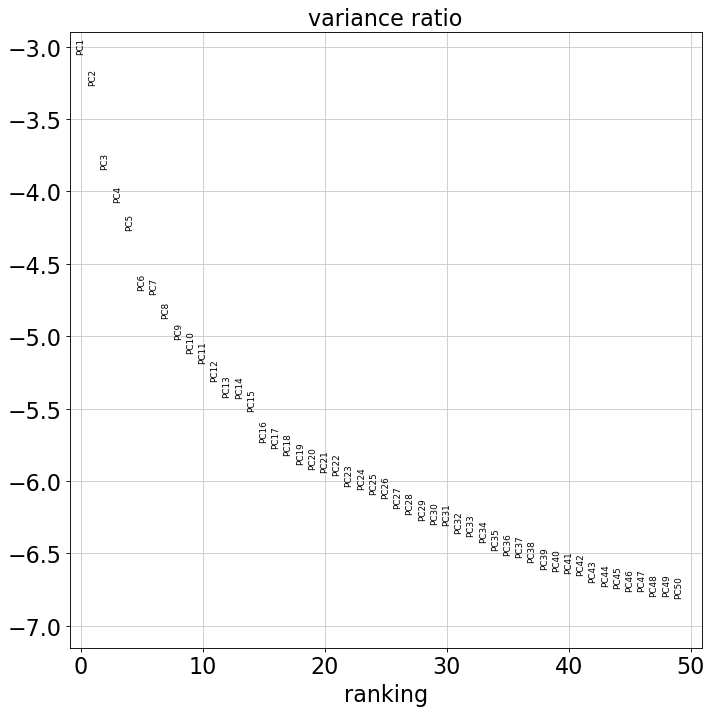

In [12]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)

In [13]:
sc.pp.neighbors(adata, n_pcs = 40, n_neighbors = 20)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [14]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [15]:
adata.write(results_file)

In [16]:
sc.tl.leiden(adata, resolution = 0.2, key_added = "leiden_0.2")
sc.tl.leiden(adata, resolution = 0.4, key_added = "leiden_0.4")
sc.tl.leiden(adata, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(adata, resolution = 0.8, key_added = "leiden_0.8")
sc.tl.leiden(adata, resolution = 1.0, key_added = "leiden_1.0")
sc.tl.leiden(adata, resolution = 1.2, key_added = "leiden_1.2")

running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden_0.8', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden_1.2', the cluster labels (adata.obs, categorical) (0:00:00)


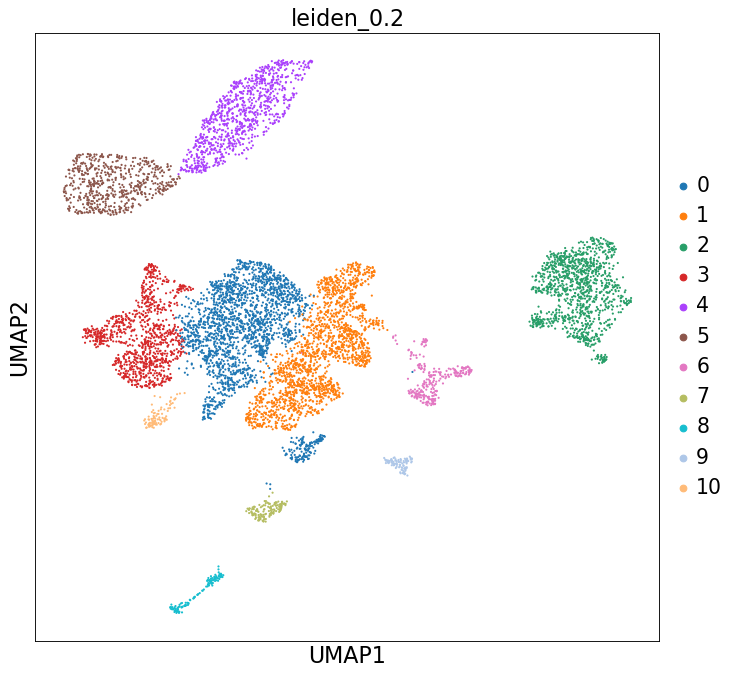

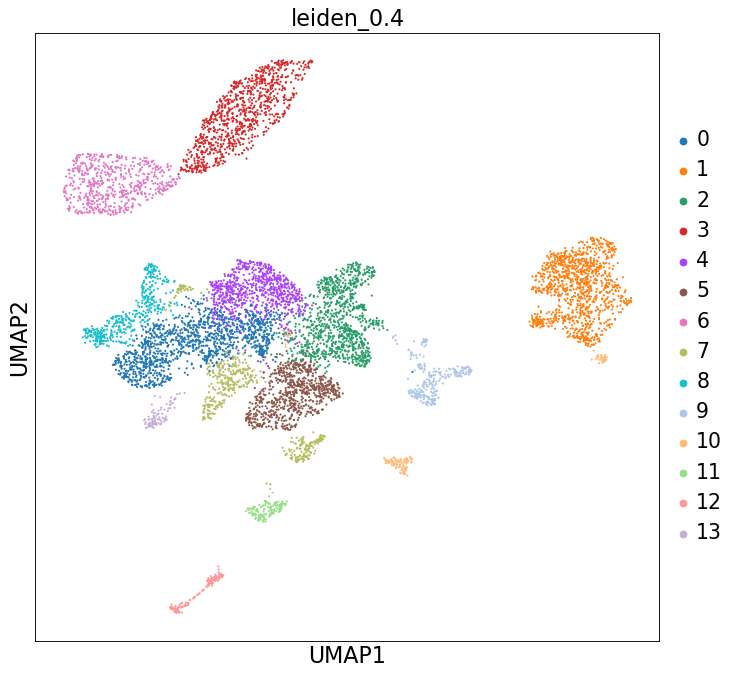

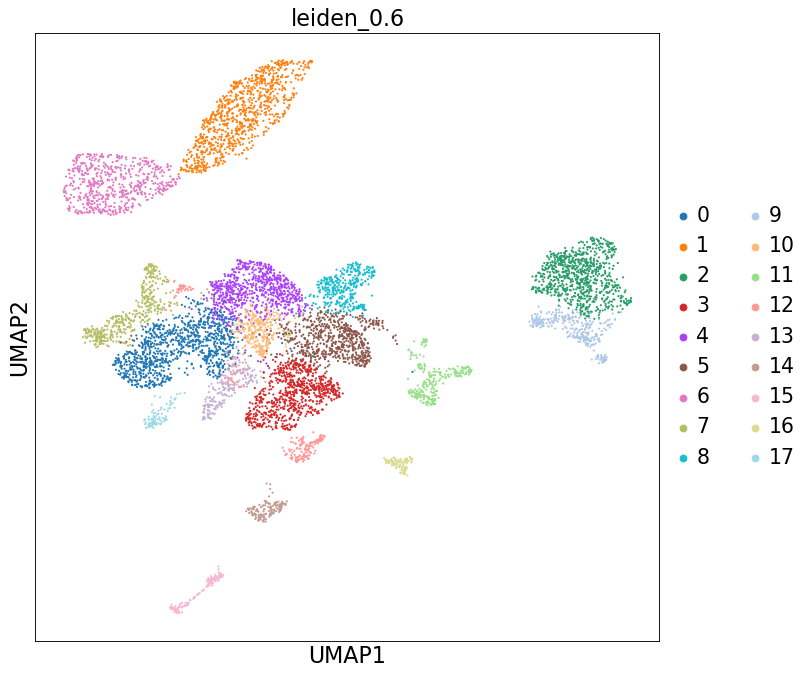

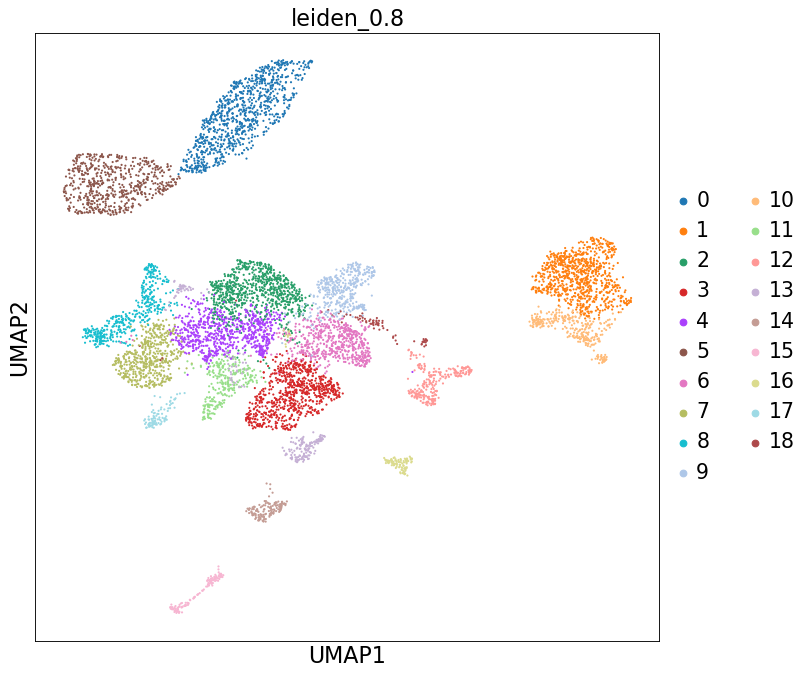

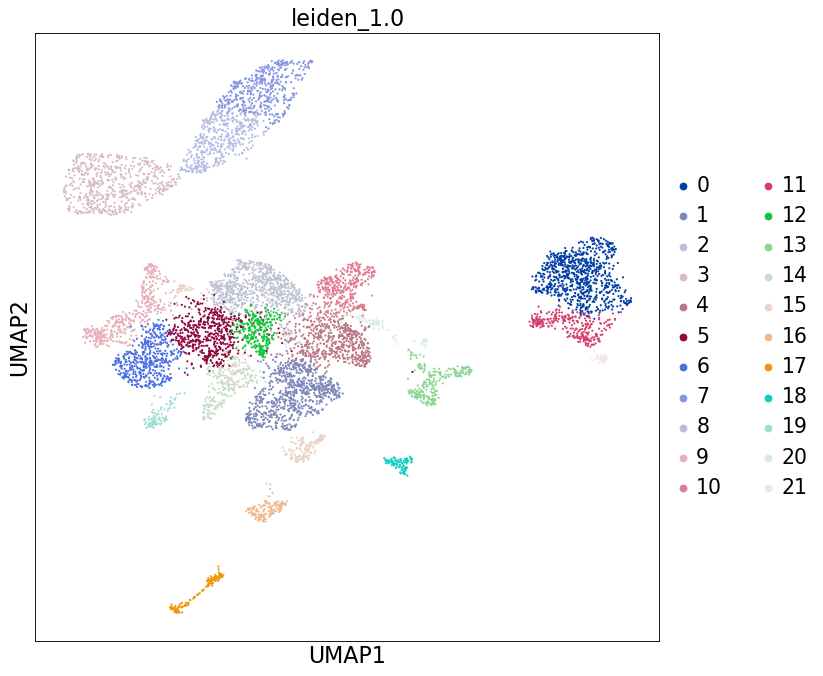

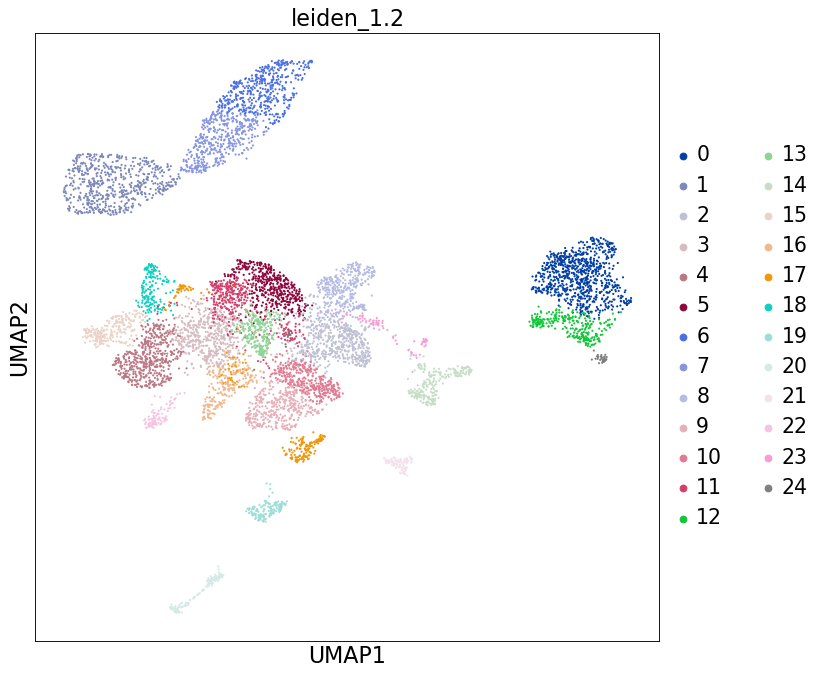

In [17]:
sc.pl.umap(adata, color='leiden_0.2')
sc.pl.umap(adata, color='leiden_0.4')
sc.pl.umap(adata, color='leiden_0.6')
sc.pl.umap(adata, color='leiden_0.8')
sc.pl.umap(adata, color='leiden_1.0')
sc.pl.umap(adata, color='leiden_1.2')

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


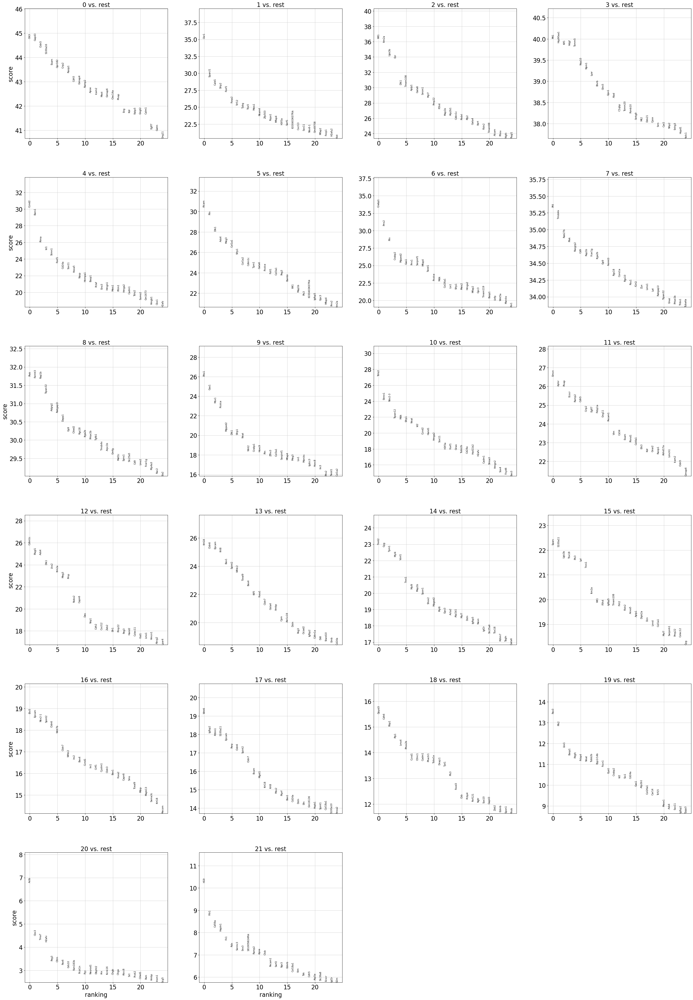

In [18]:
sc.tl.rank_genes_groups(adata, 'leiden_1.0', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

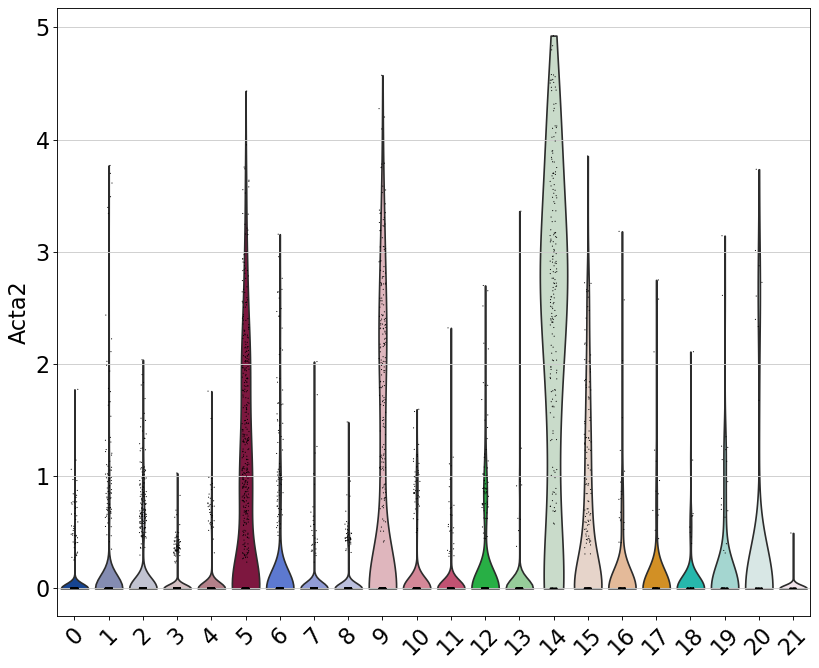

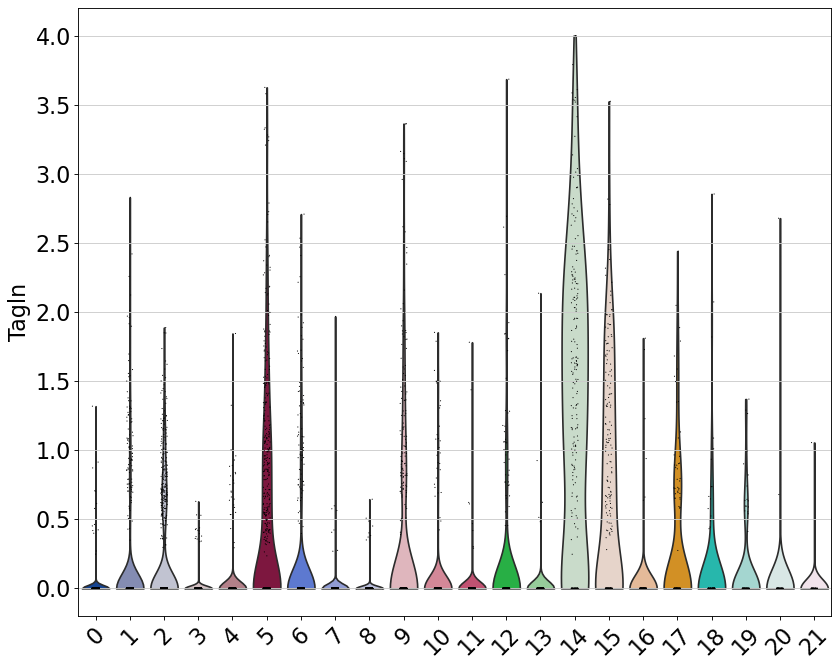

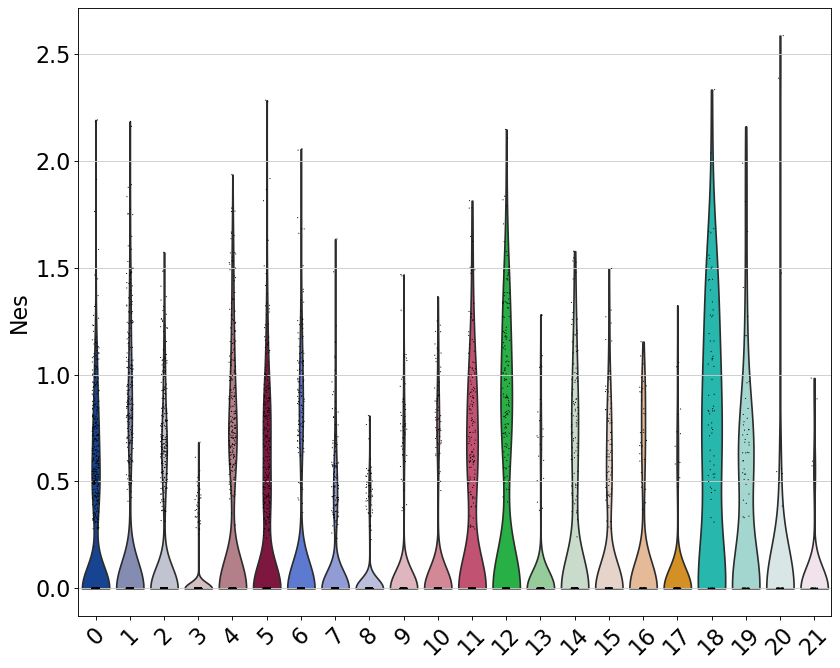

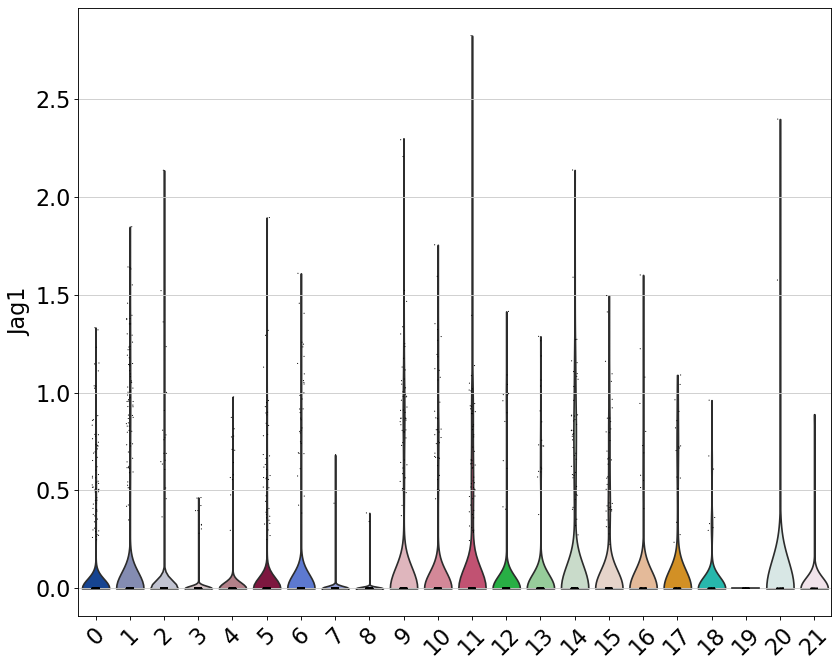

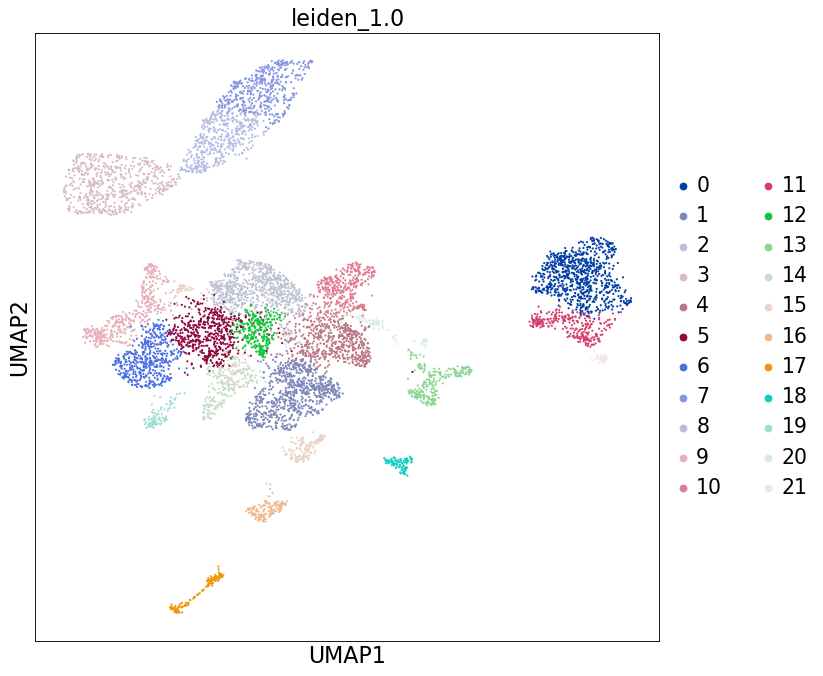

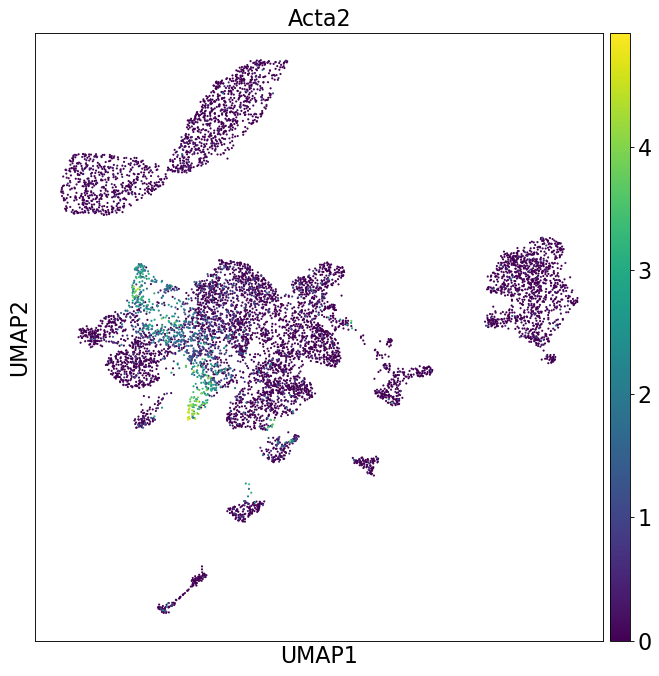

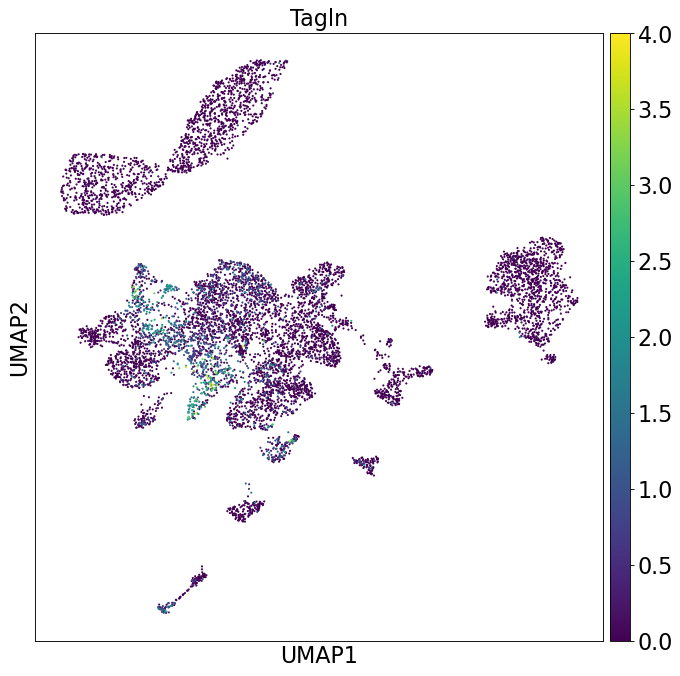

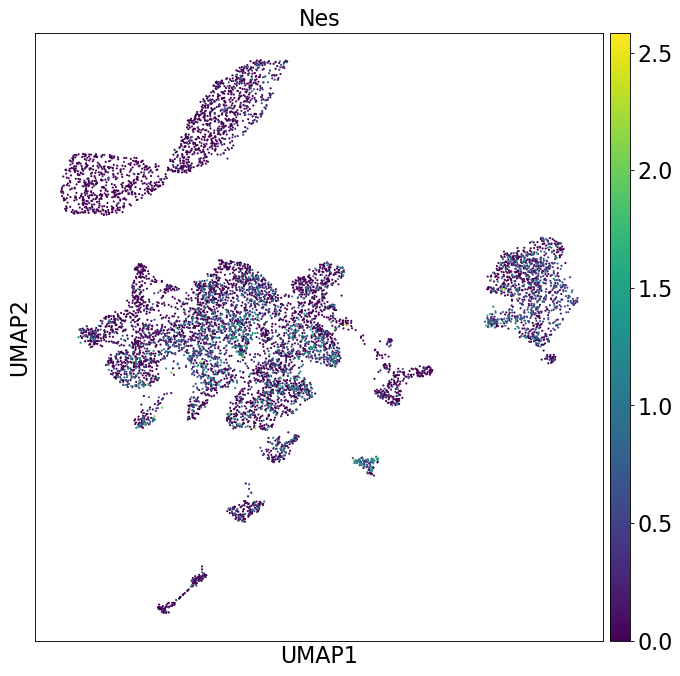

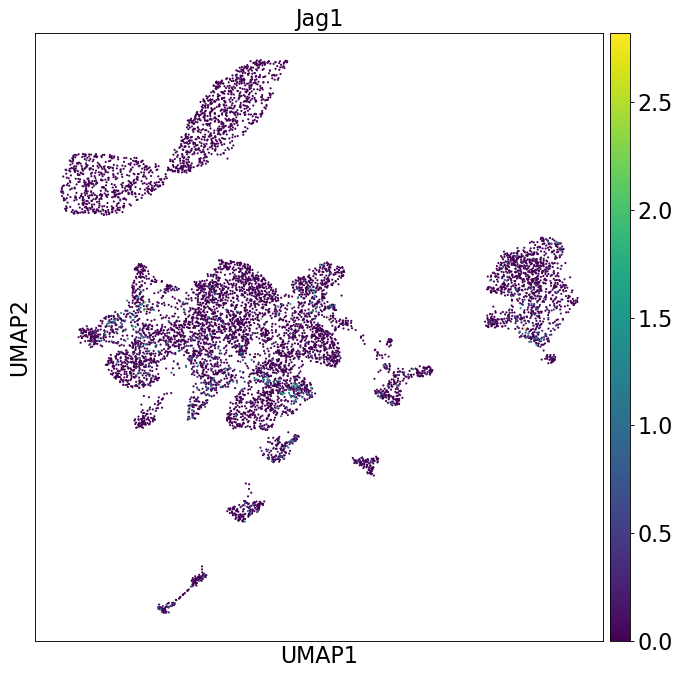

In [19]:
sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Jag1'], groupby = 'leiden_1.0', rotation=45)
sc.pl.umap(adata, color='leiden_1.0')
sc.pl.umap(adata, color='Acta2')
sc.pl.umap(adata, color='Tagln')
sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Jag1')

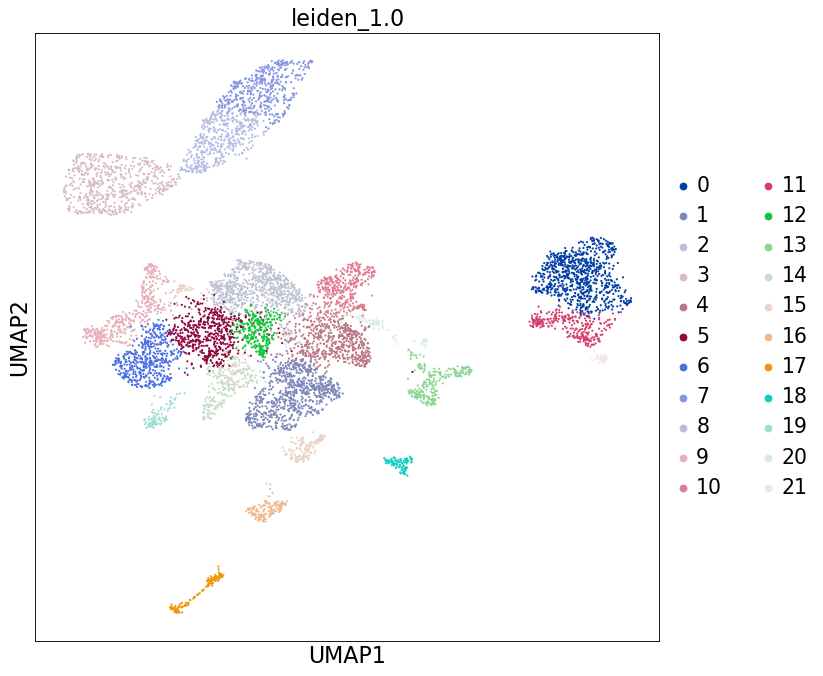

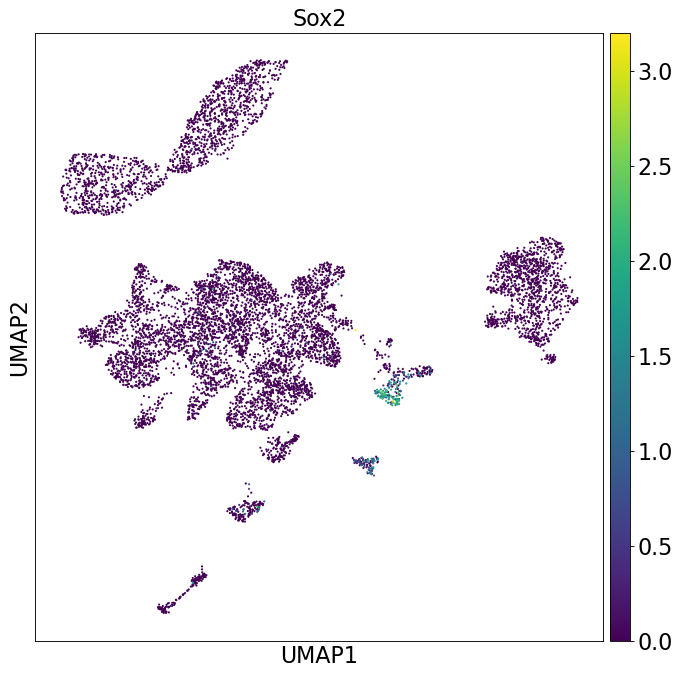

In [20]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Sox2'], groupby = 'leiden_1.0', rotation=45)
sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Sox2')

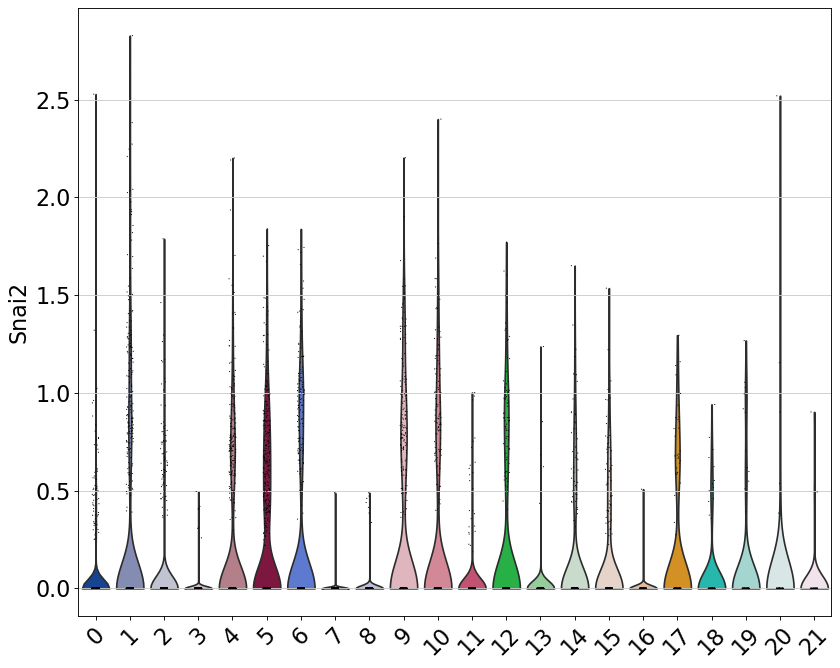

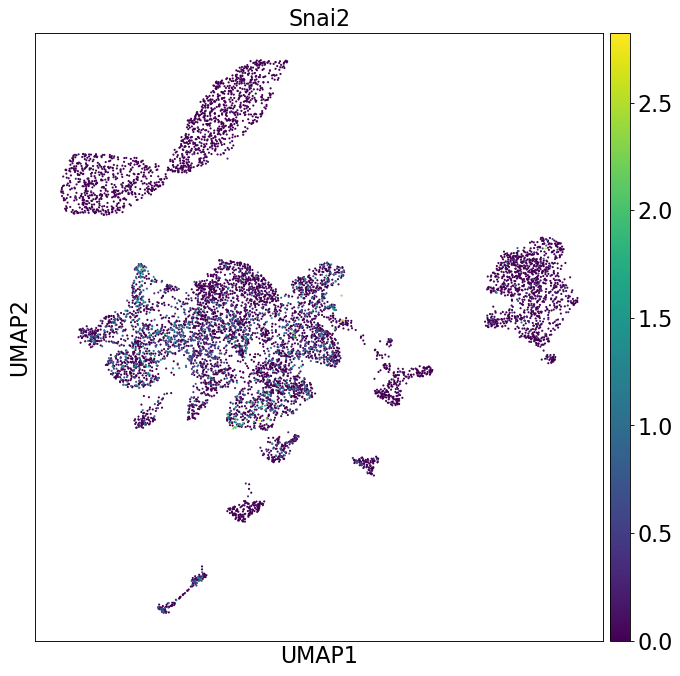

In [21]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Snai2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Snai2')

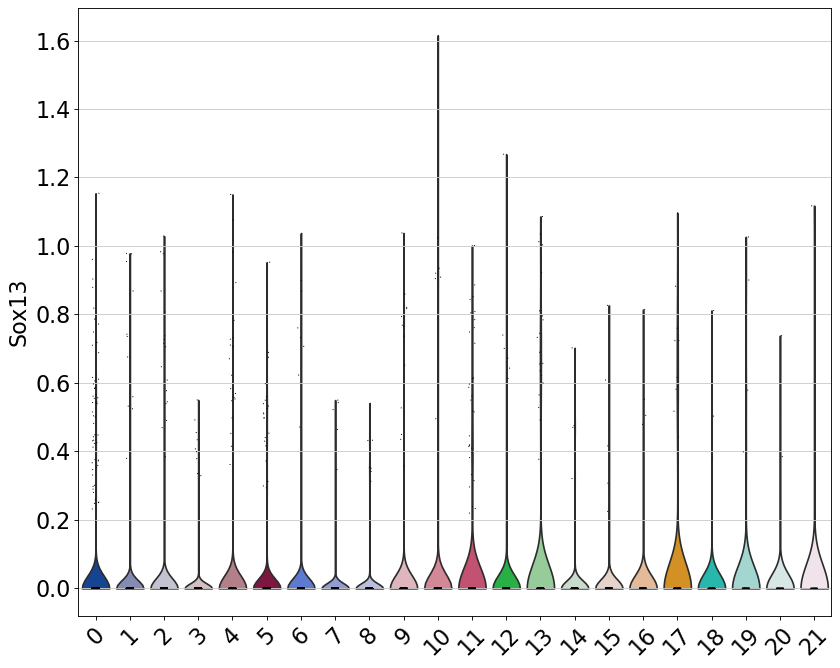

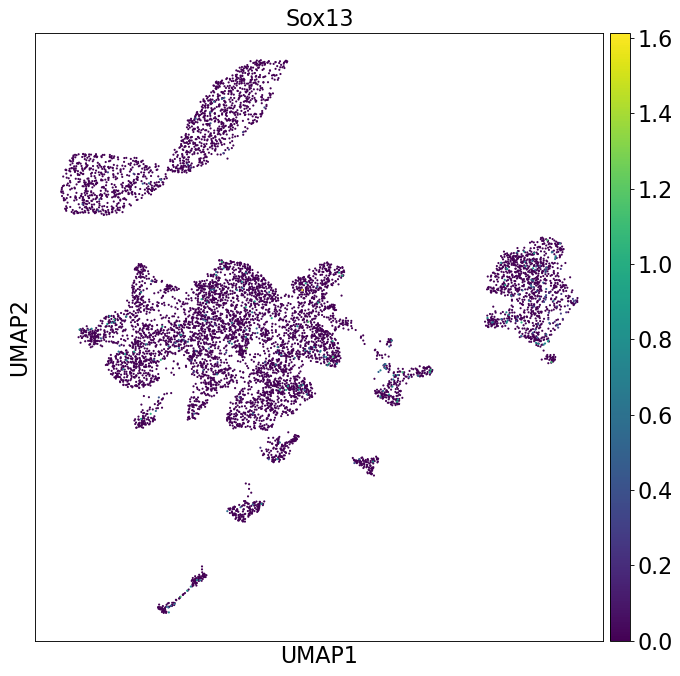

In [22]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Sox13'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Sox13')

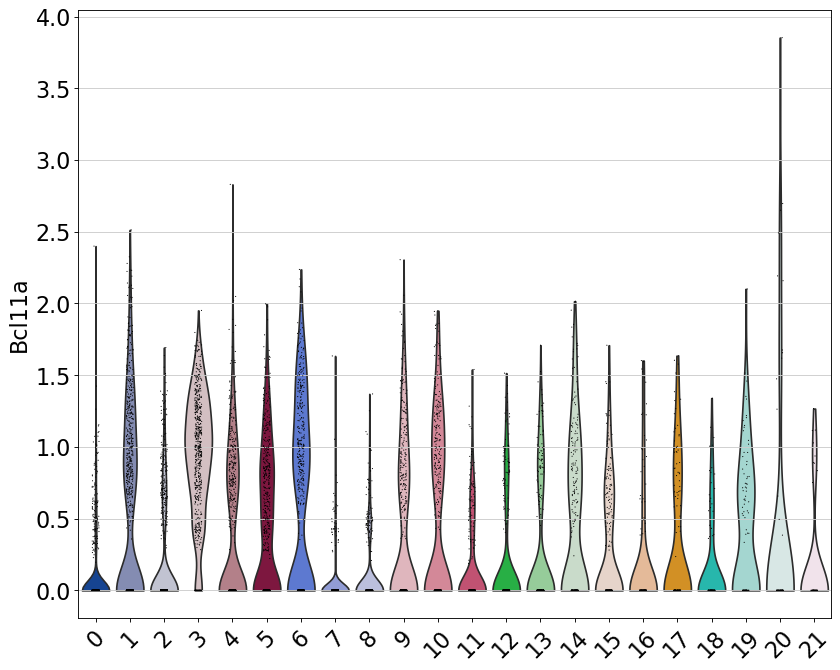

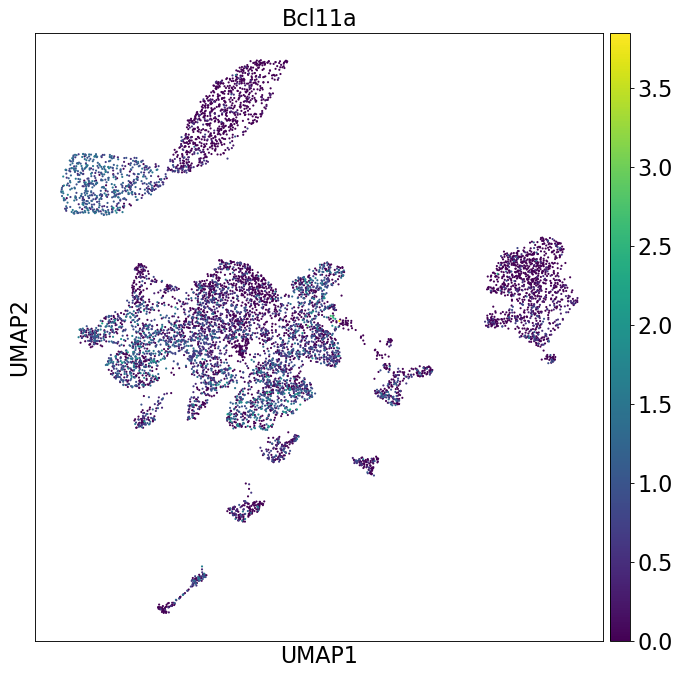

In [23]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Bcl11a'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Bcl11a')

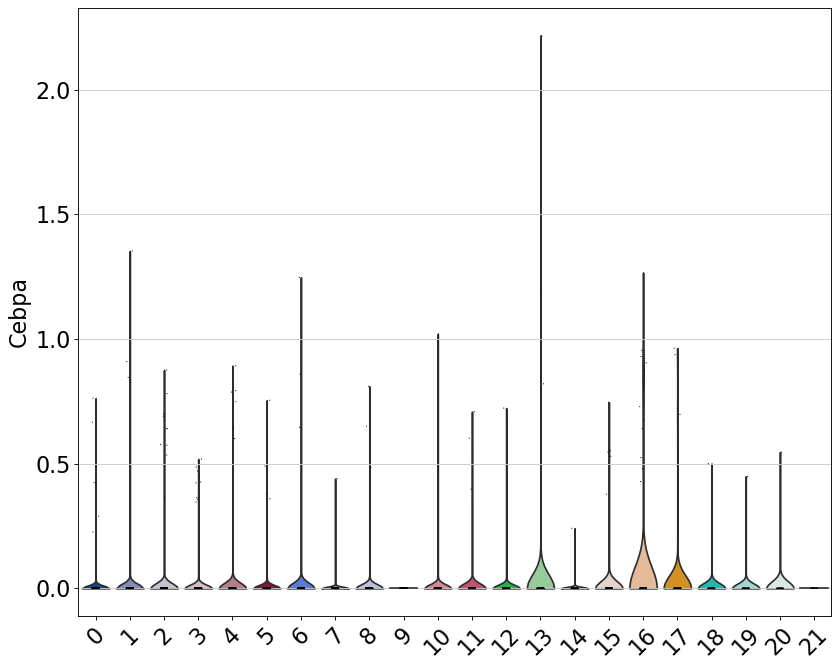

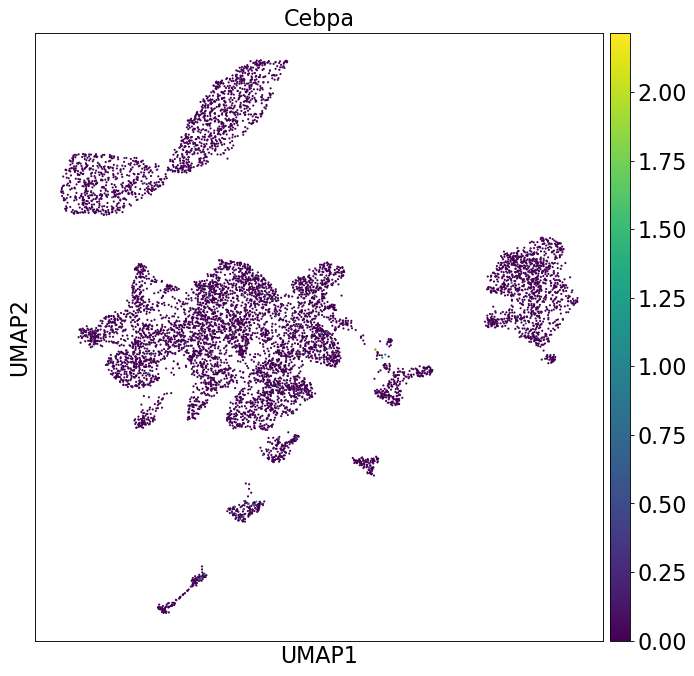

In [24]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Cebpa'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Cebpa')

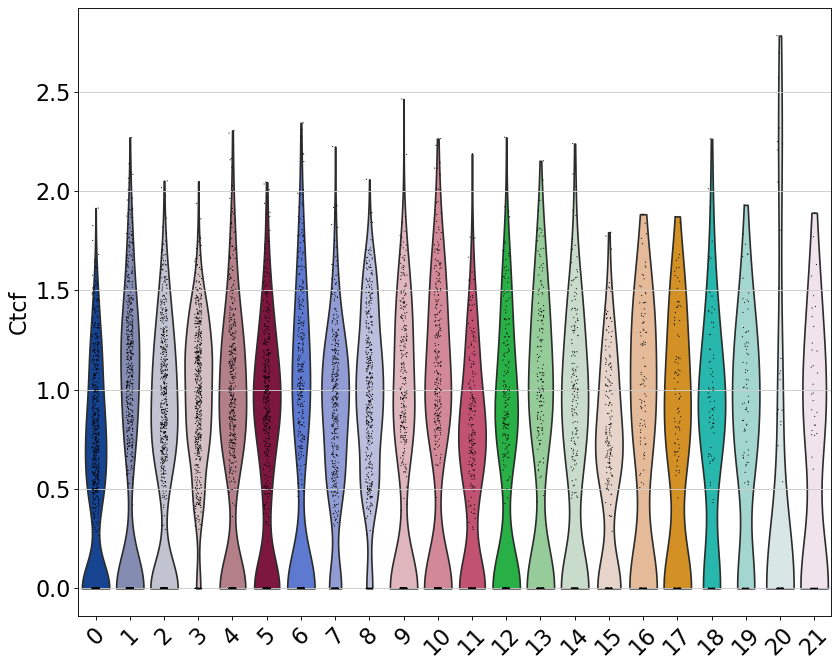

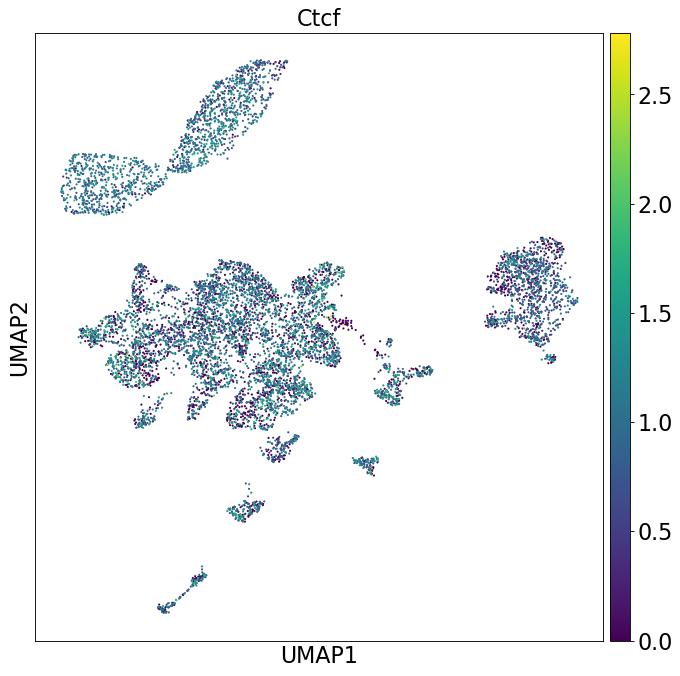

In [25]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Ctcf'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Ctcf')

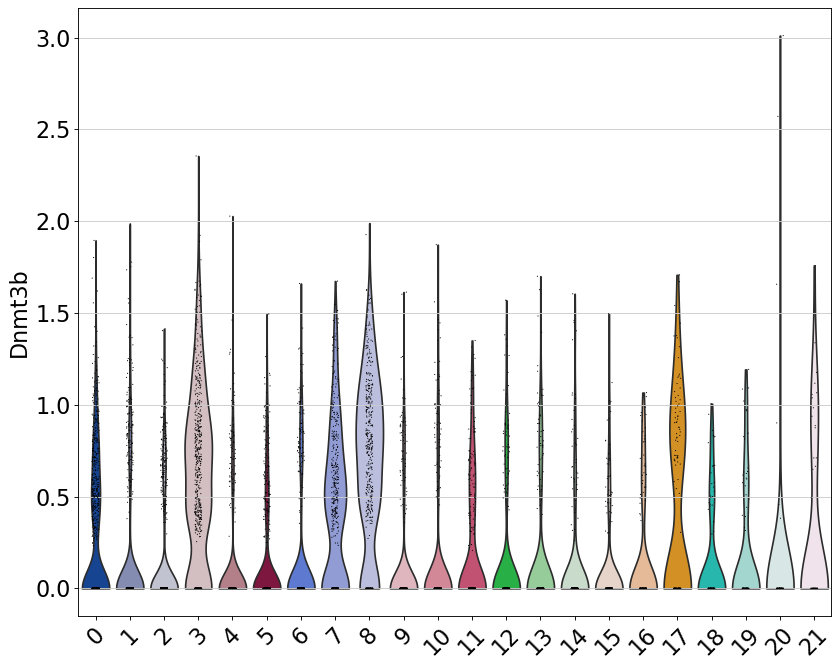

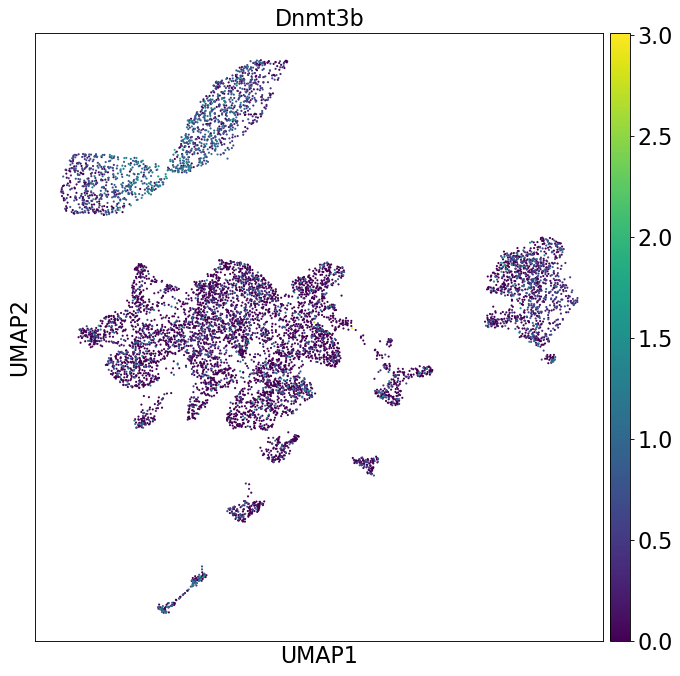

In [26]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Dnmt3b'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Dnmt3b')

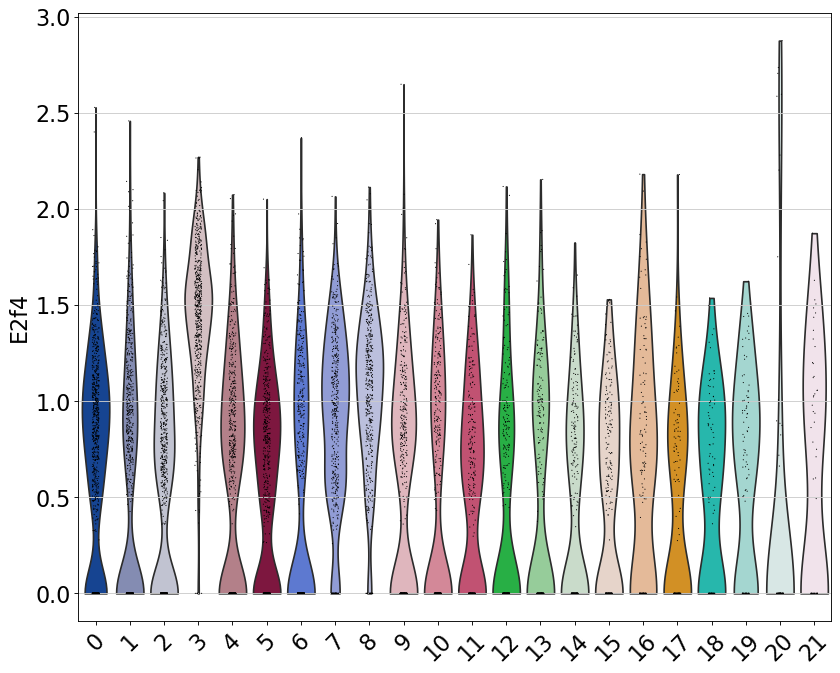

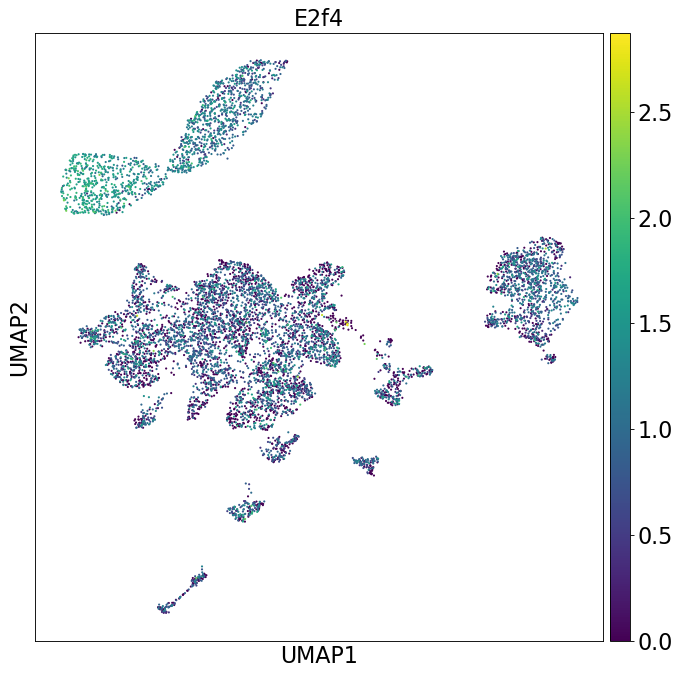

In [27]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['E2f4'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='E2f4')

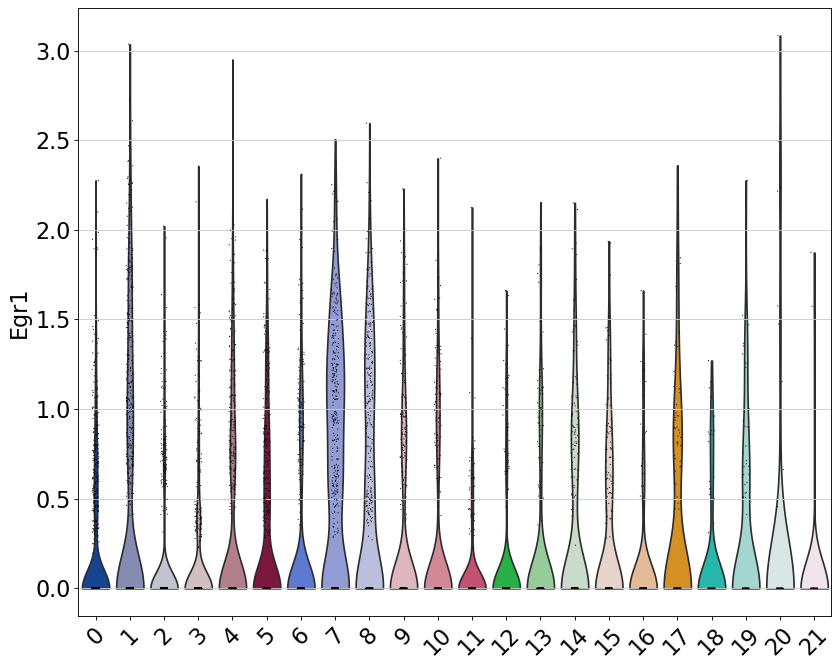

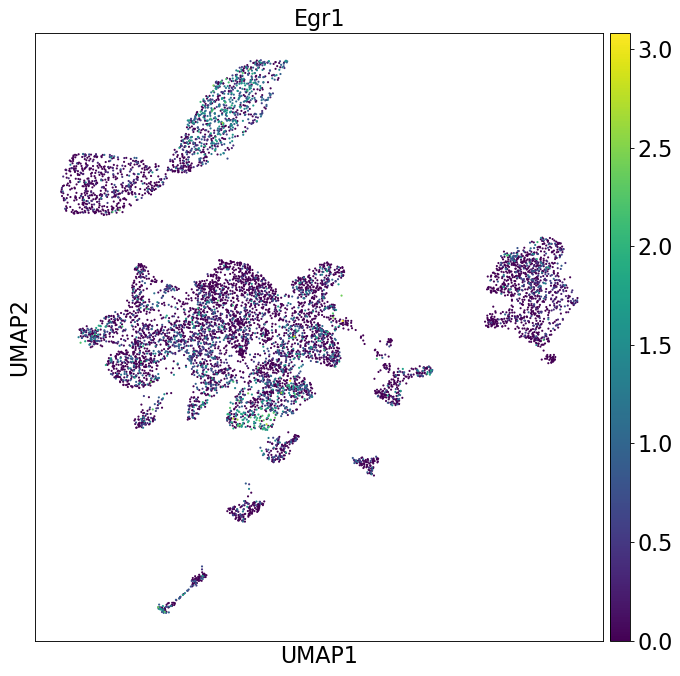

In [28]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Egr1'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Egr1')

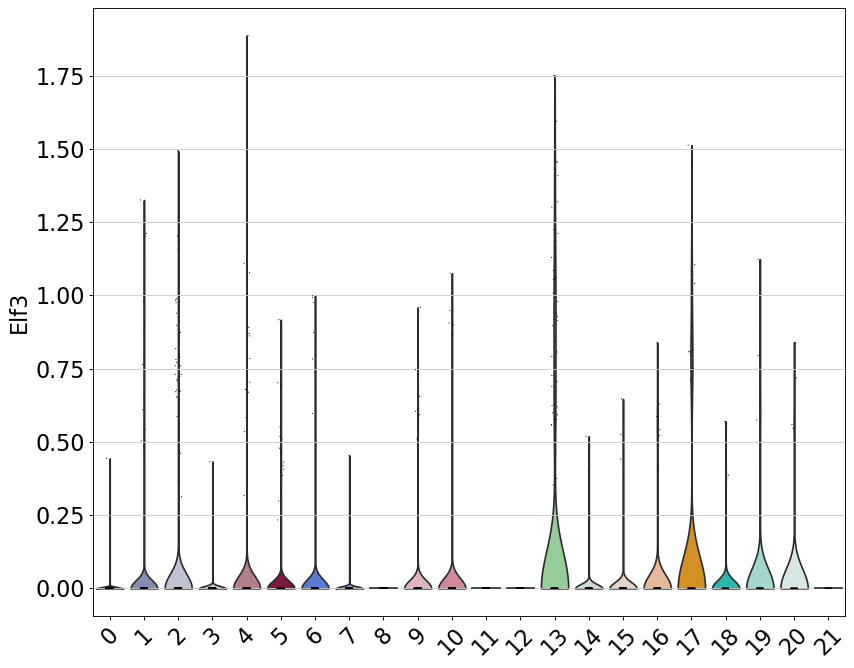

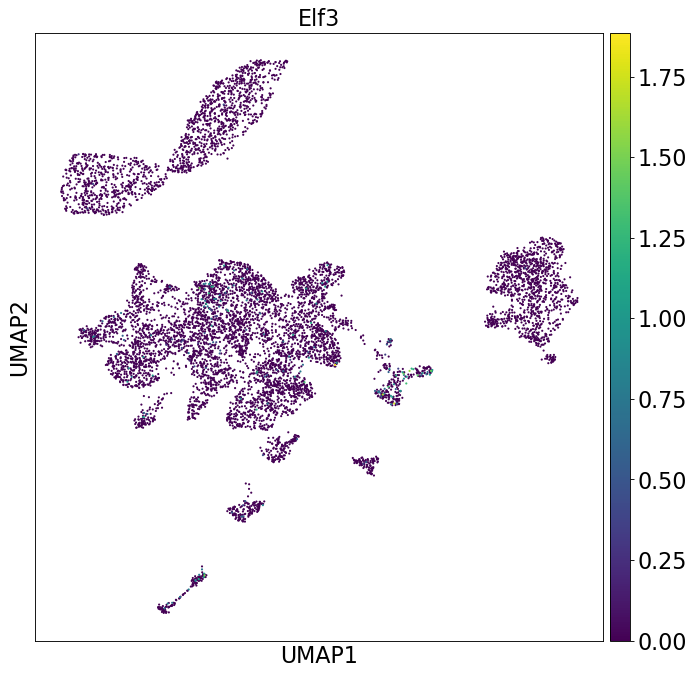

In [29]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Elf3'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Elf3')

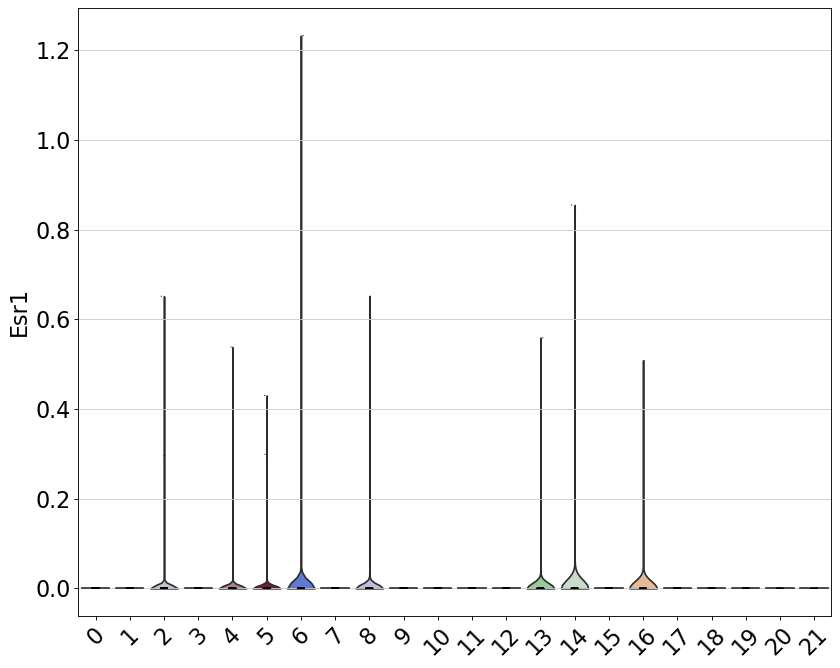

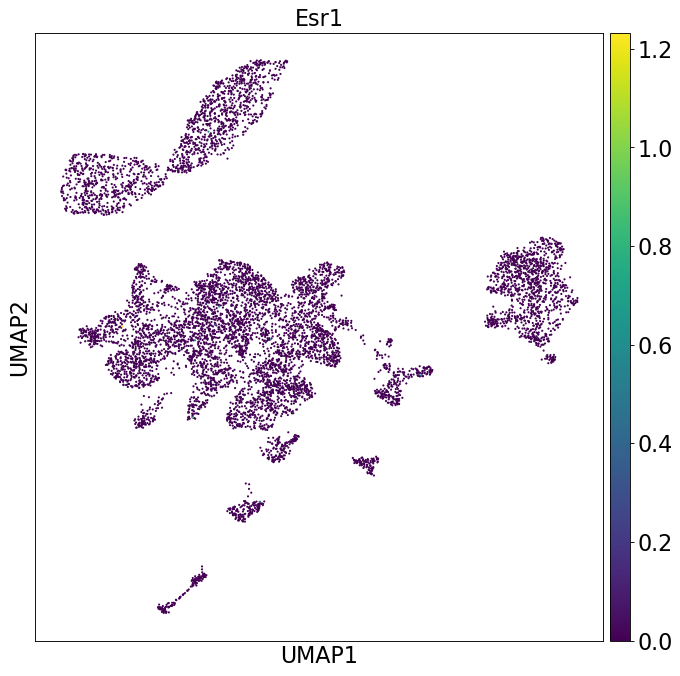

In [30]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Esr1'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Esr1')

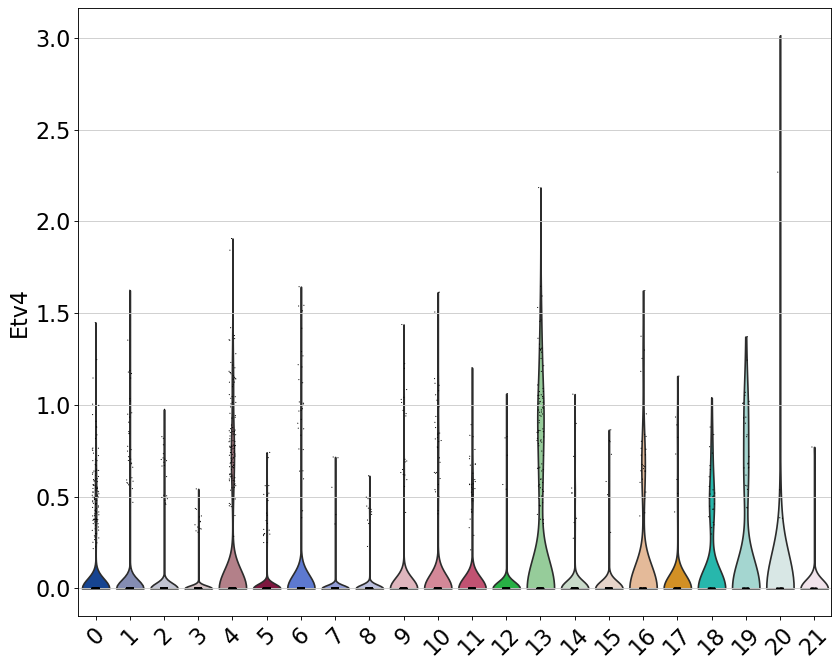

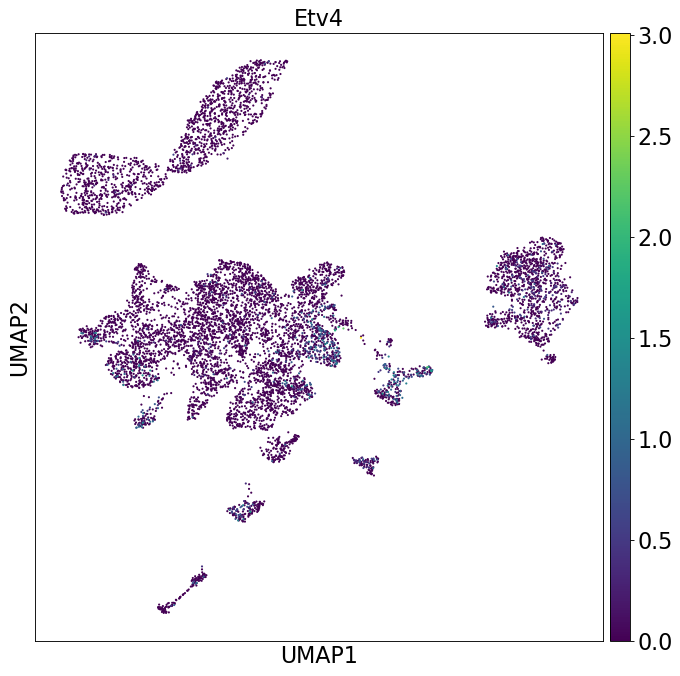

In [31]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Etv4'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Etv4')

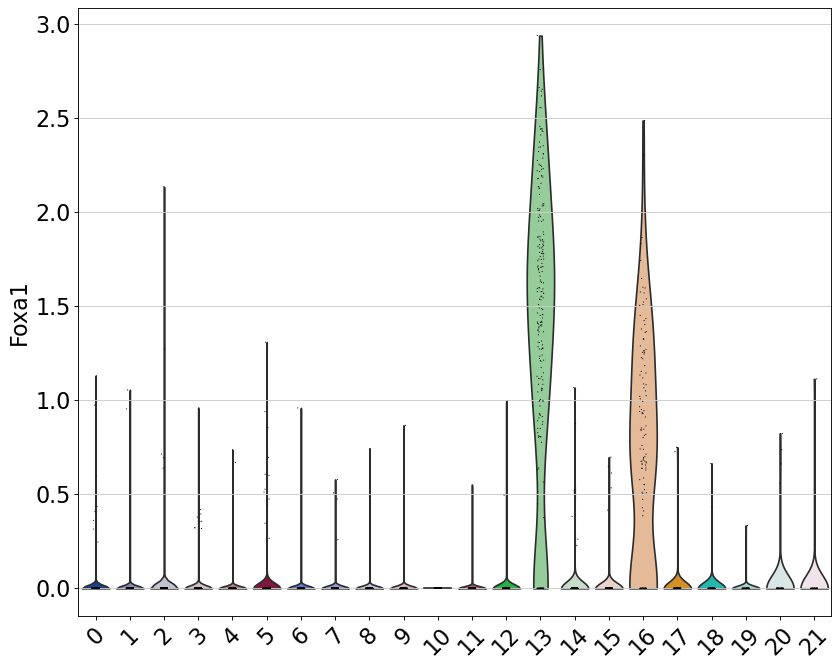

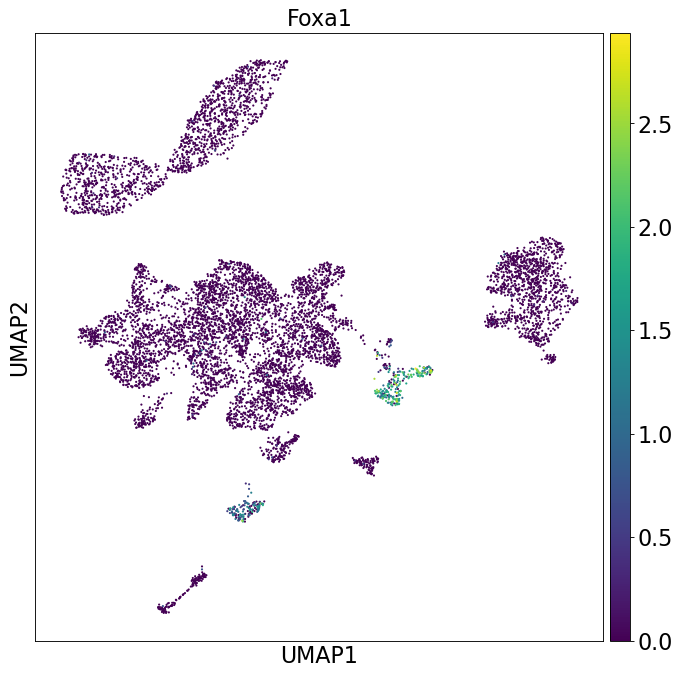

In [32]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Foxa1'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Foxa1')

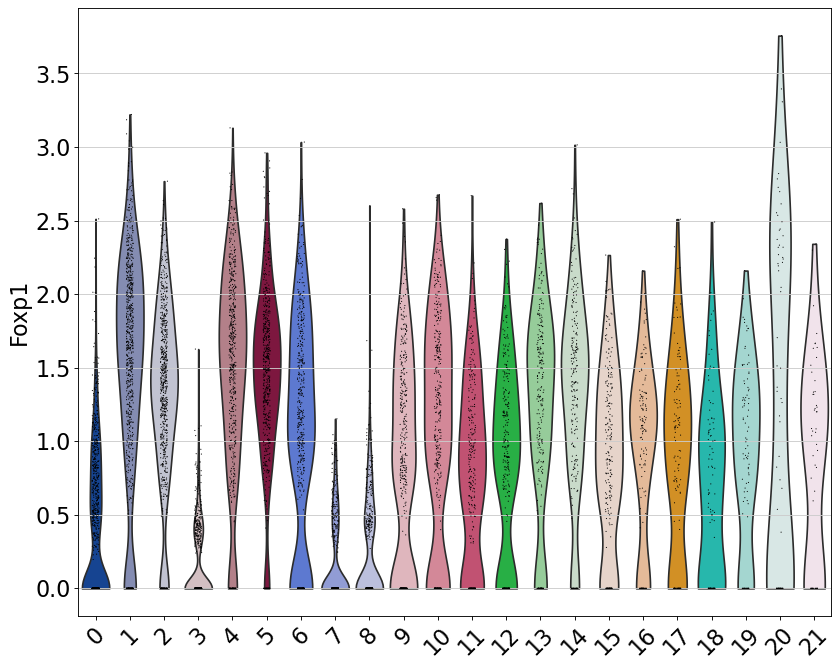

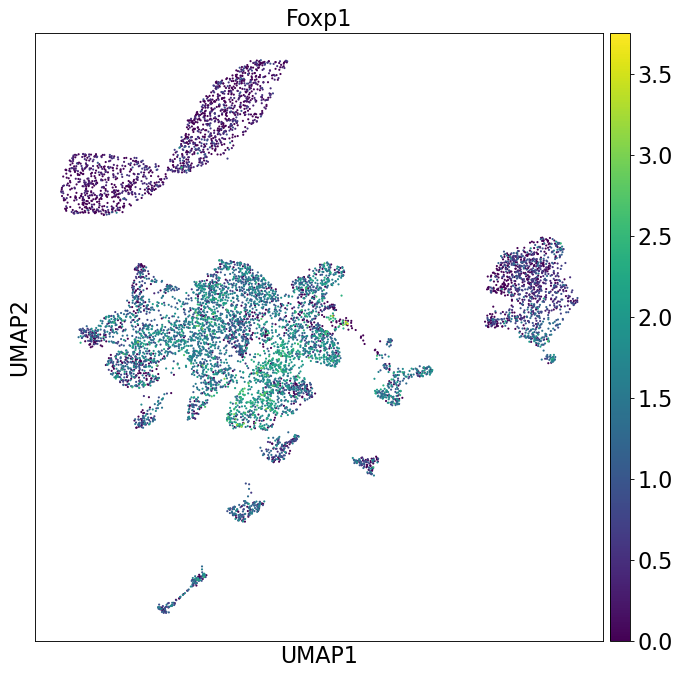

In [33]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Foxp1'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Foxp1')

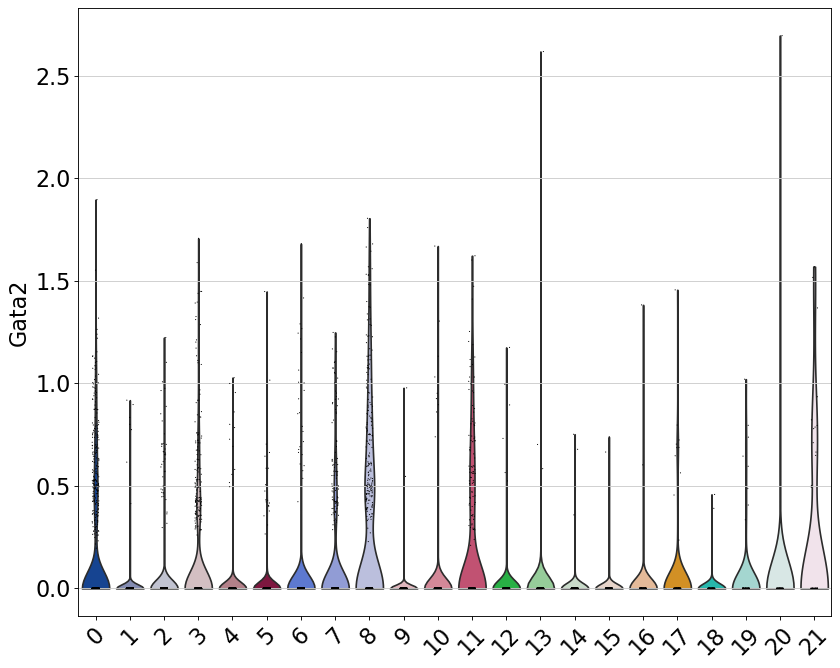

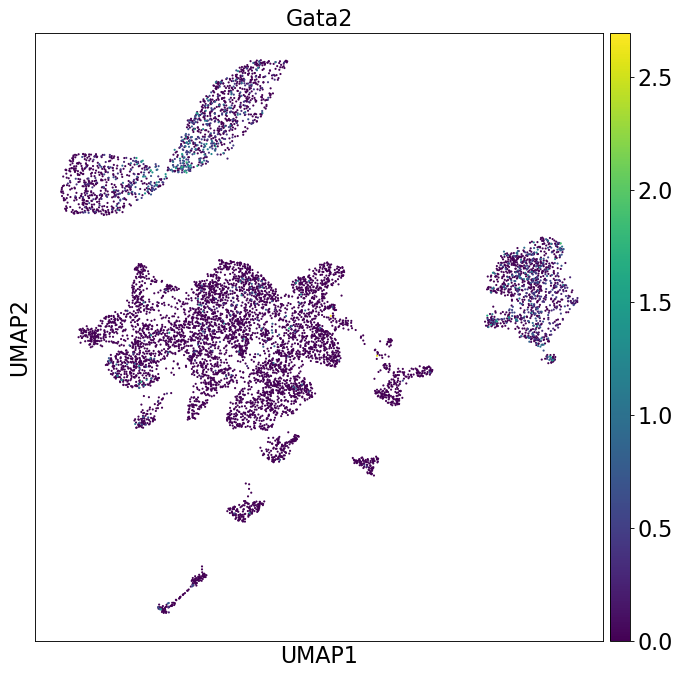

In [34]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Gata2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Gata2')

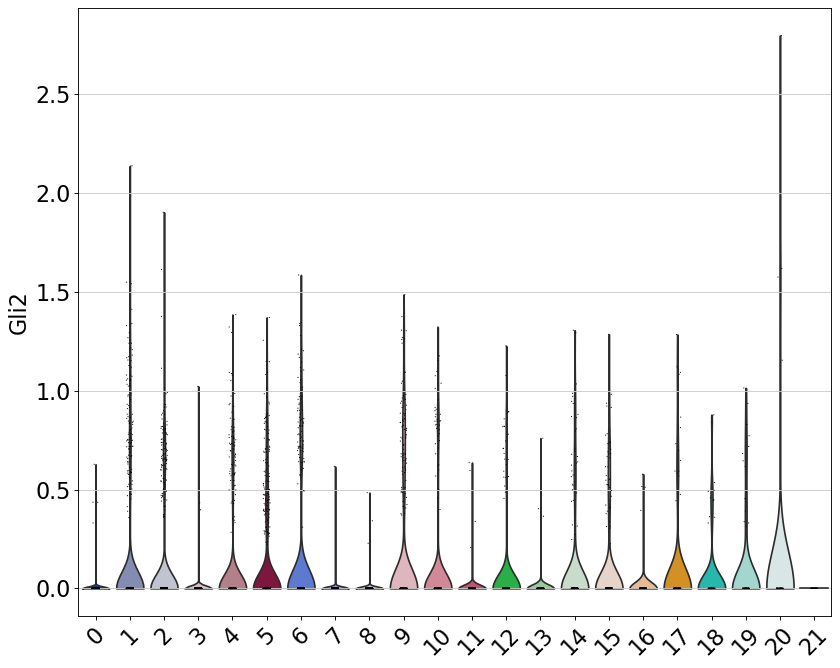

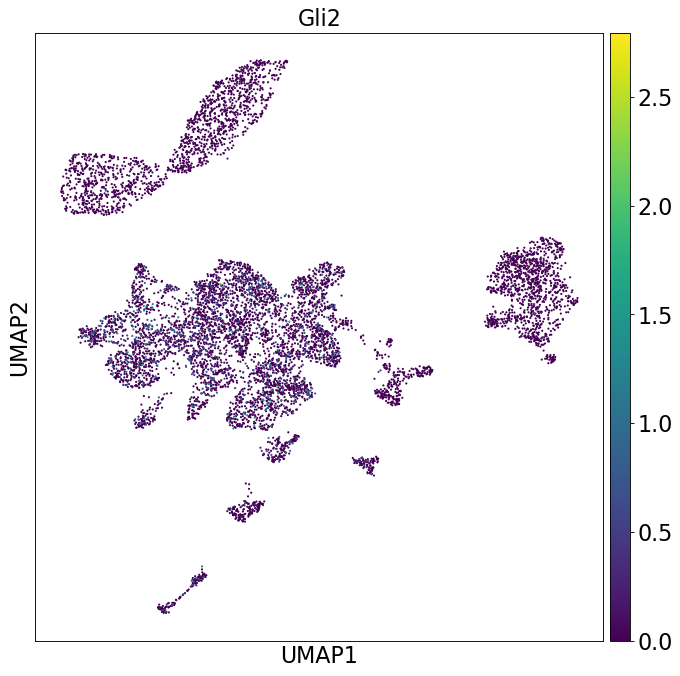

In [35]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Gli2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Gli2')

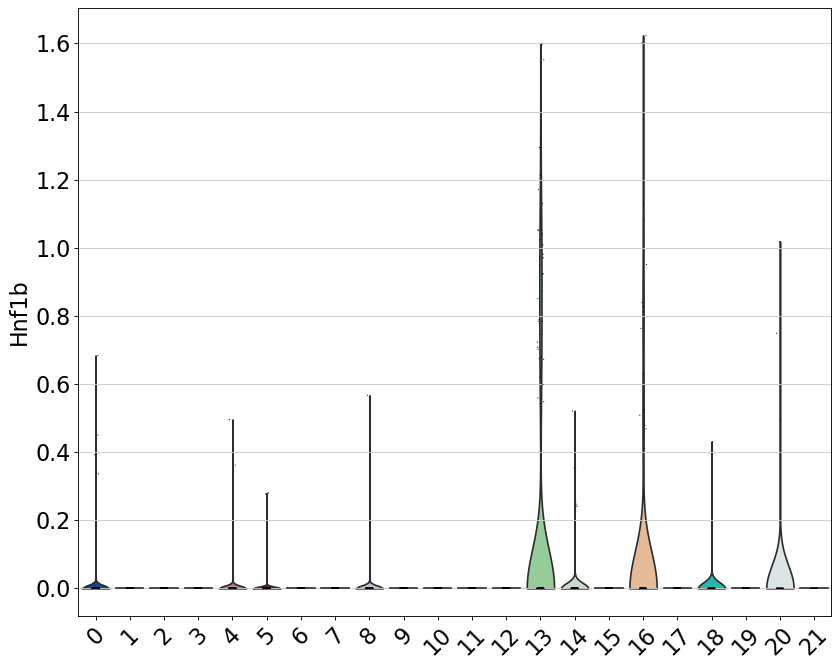

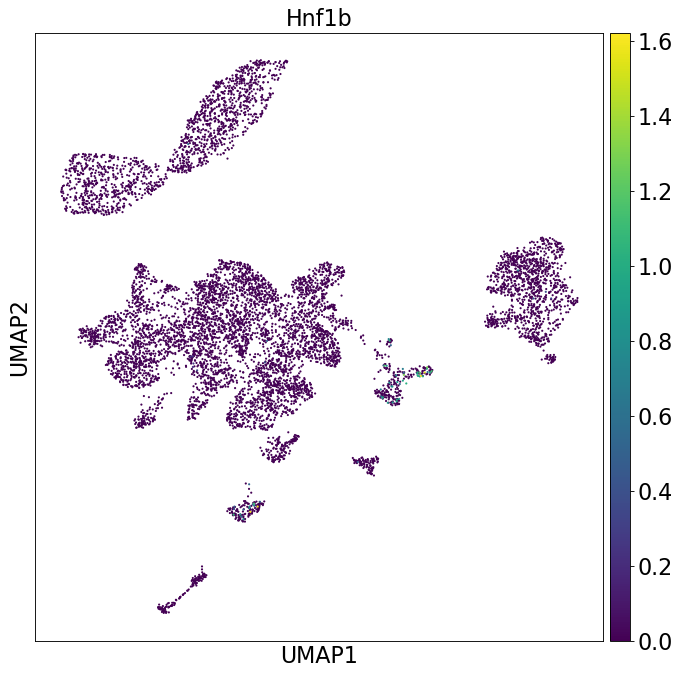

In [36]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Hnf1b'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Hnf1b')

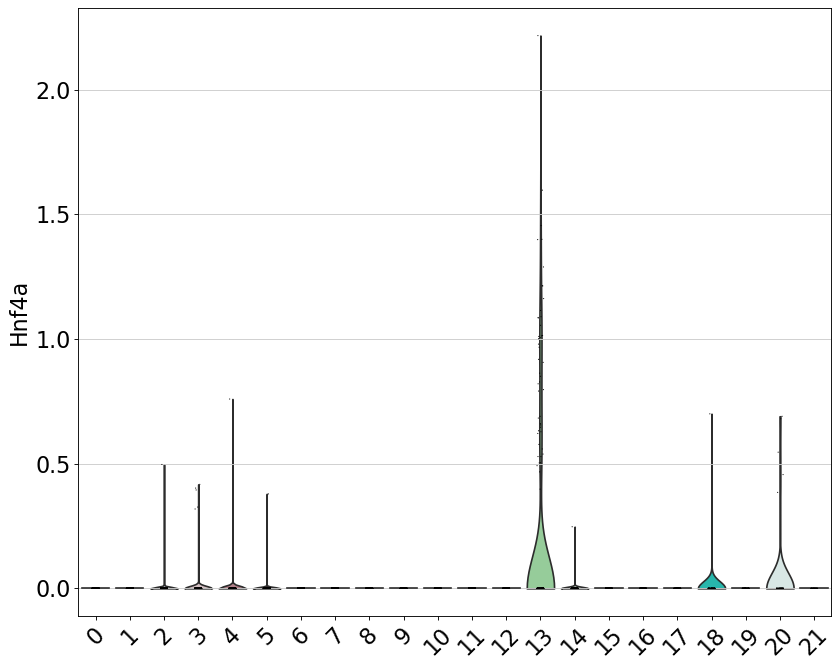

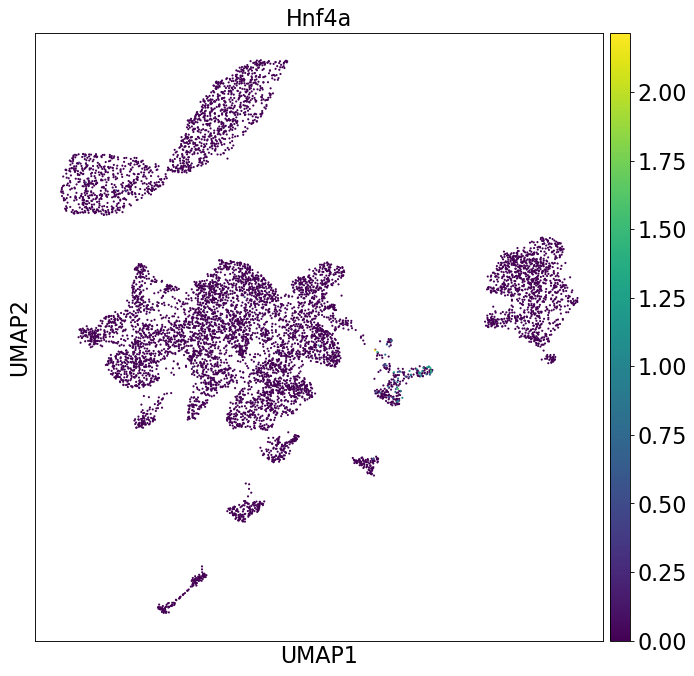

In [37]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Hnf4a'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Hnf4a')

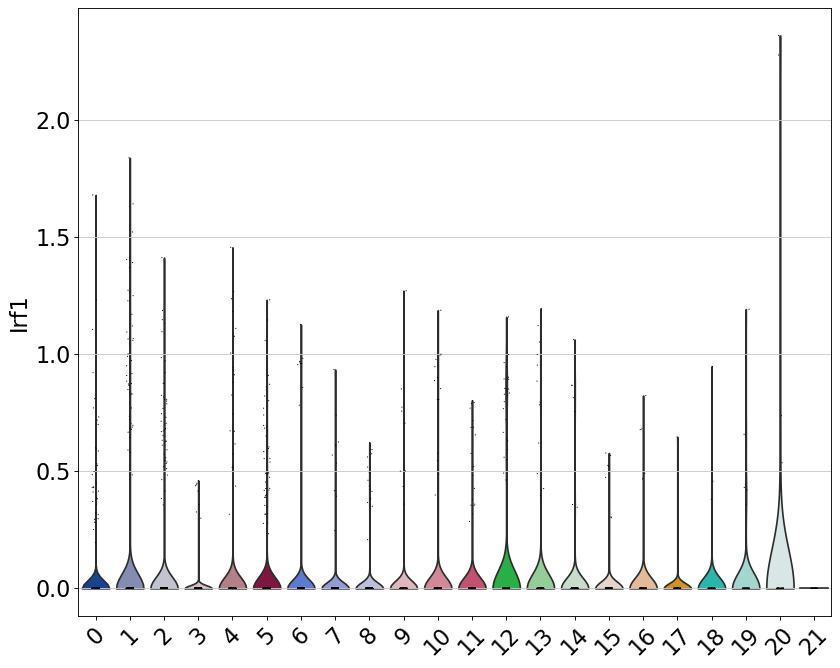

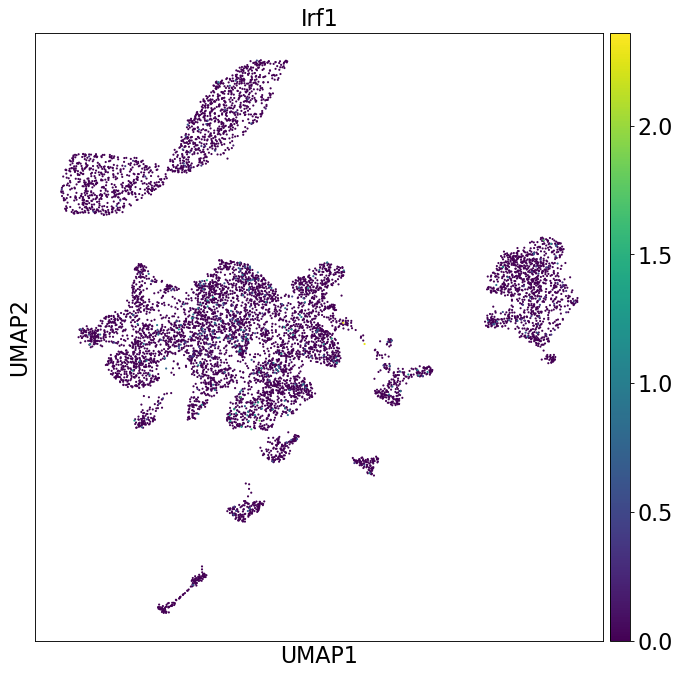

In [38]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Irf1'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Irf1')

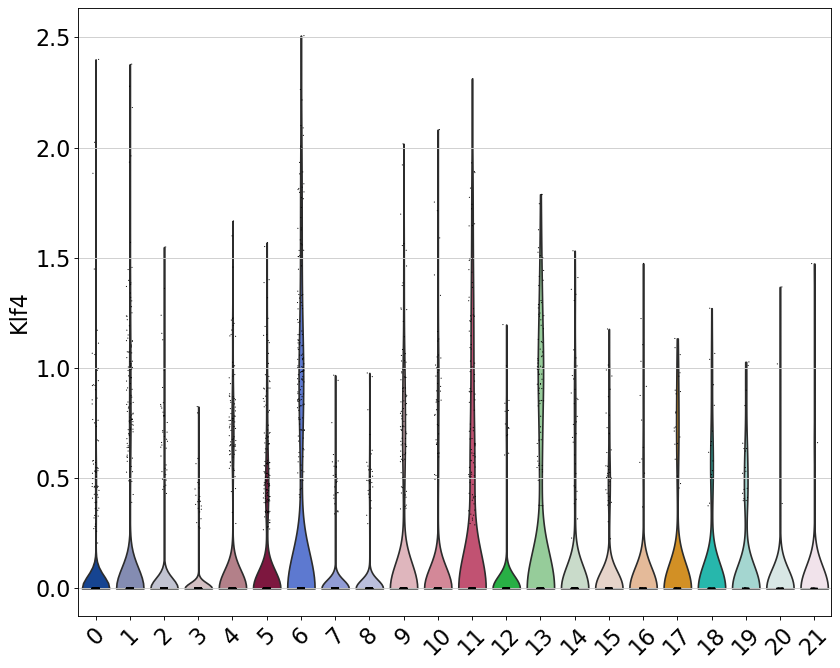

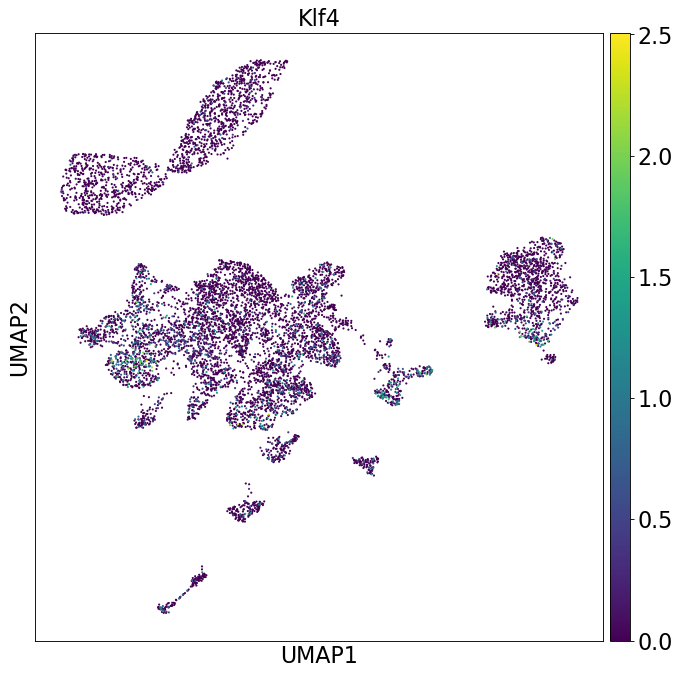

In [39]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Klf4'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Klf4')

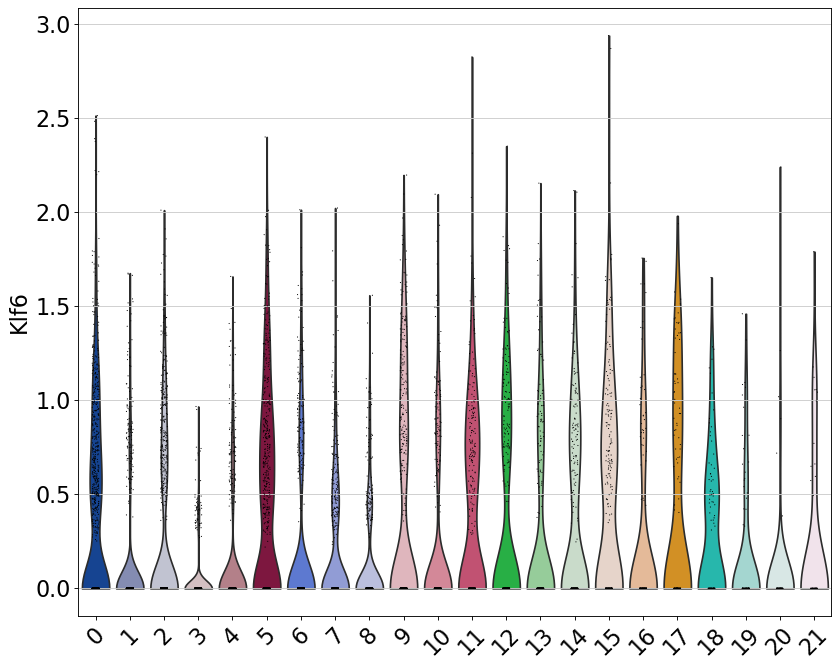

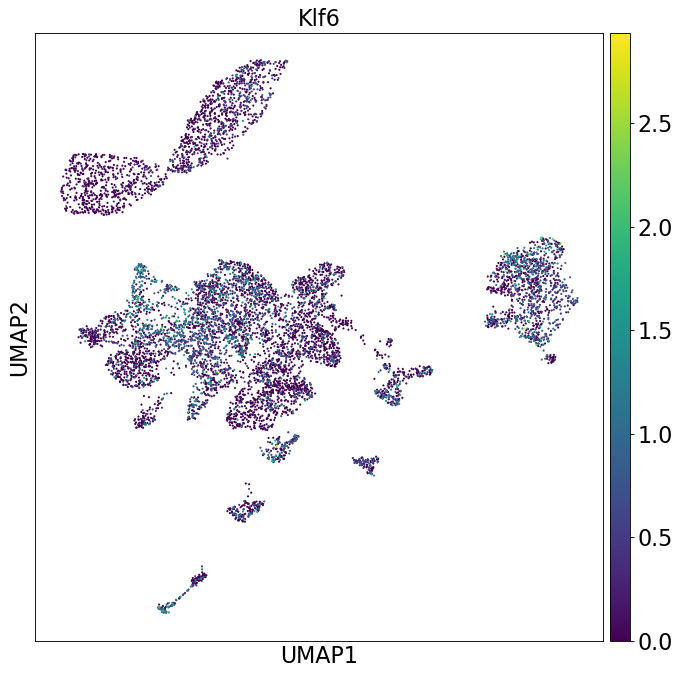

In [40]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Klf6'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Klf6')

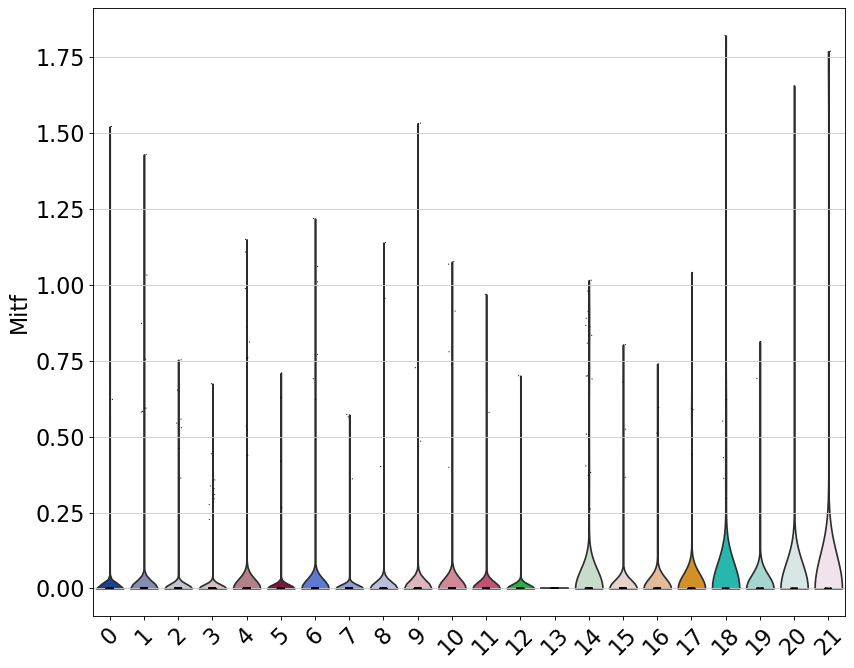

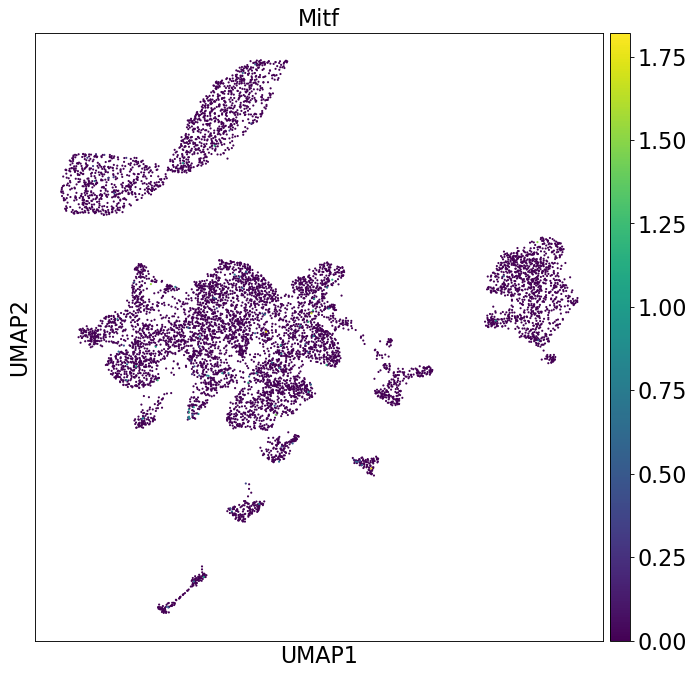

In [41]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Mitf'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Mitf')

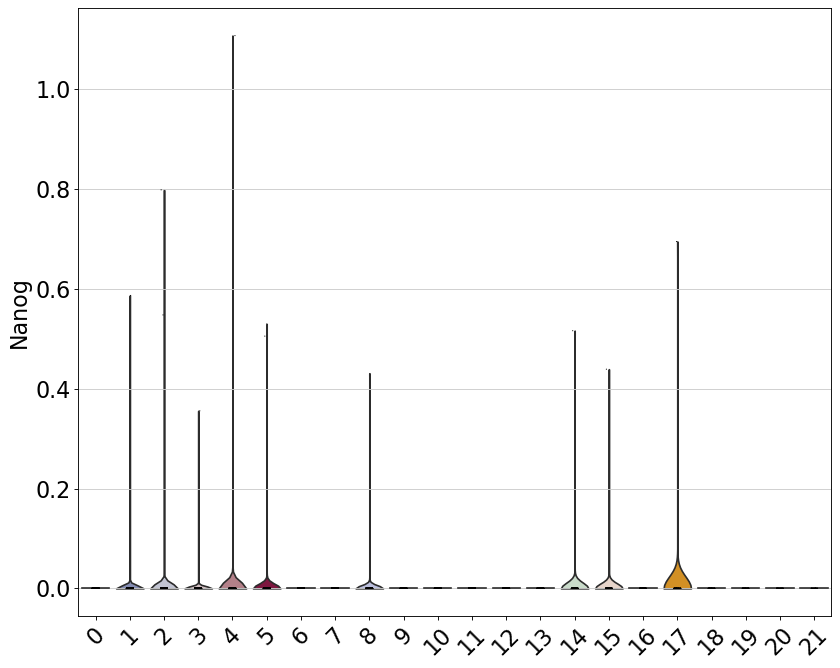

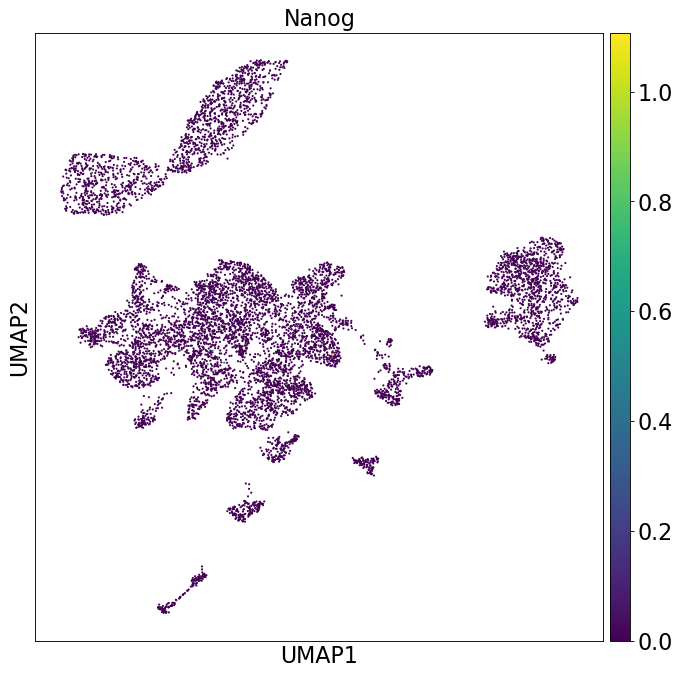

In [42]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Nanog'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Nanog')

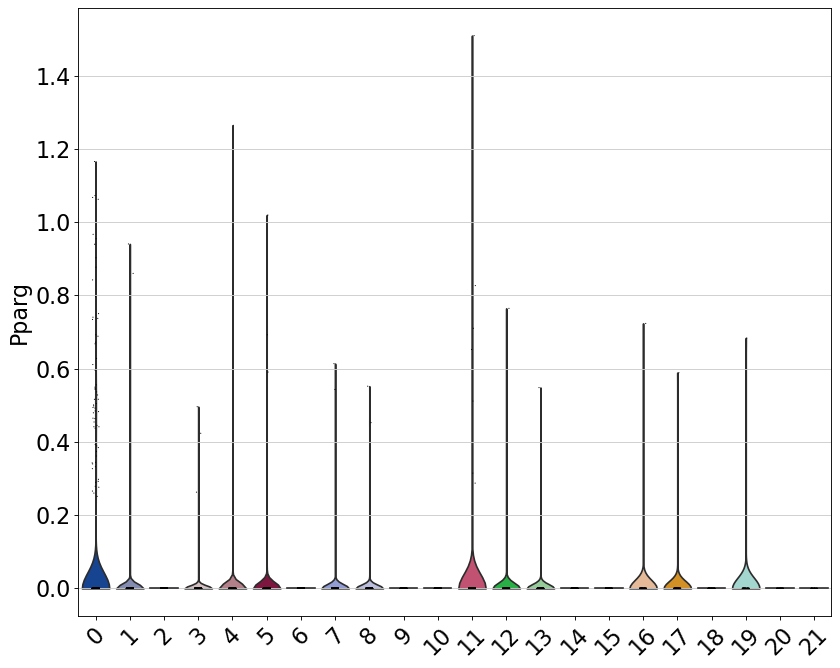

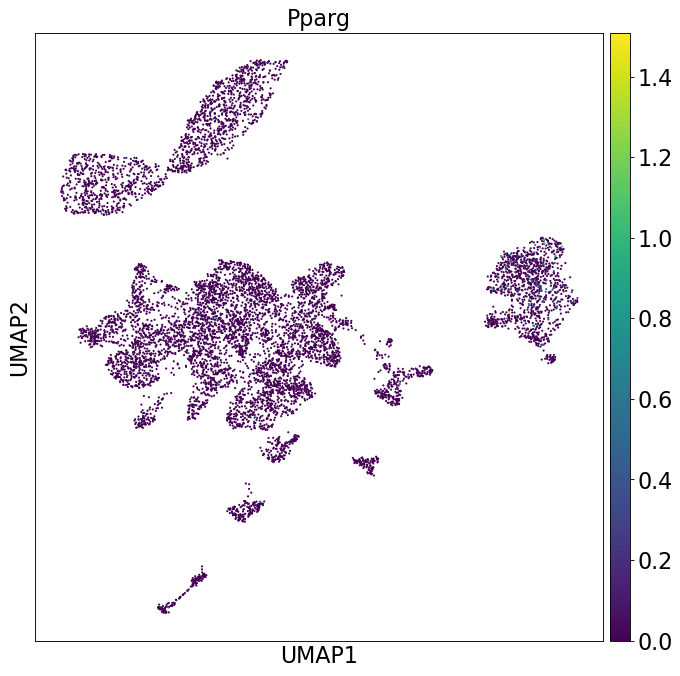

In [43]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Pparg'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Pparg')

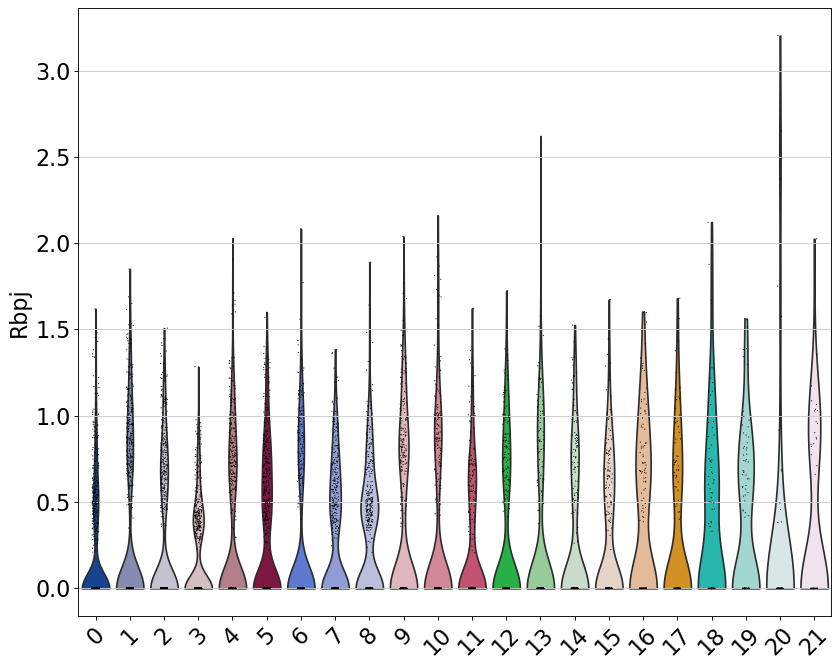

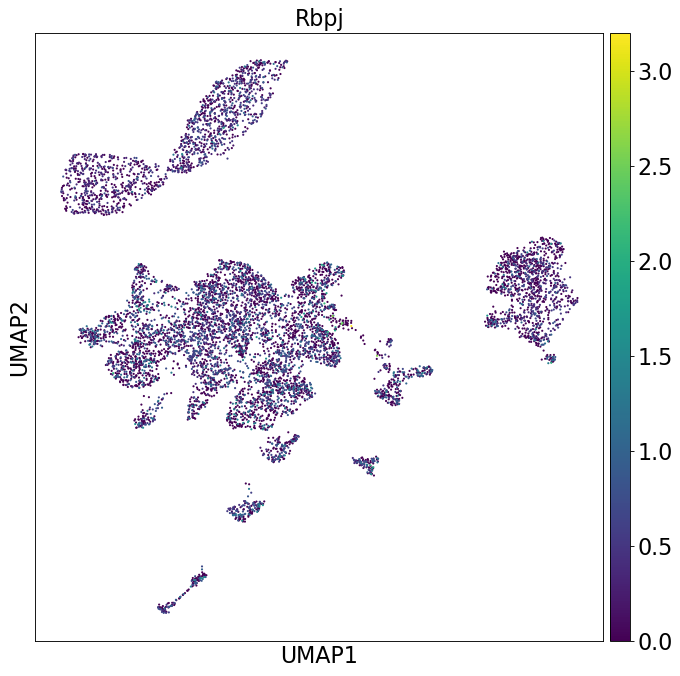

In [44]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Rbpj'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Rbpj')

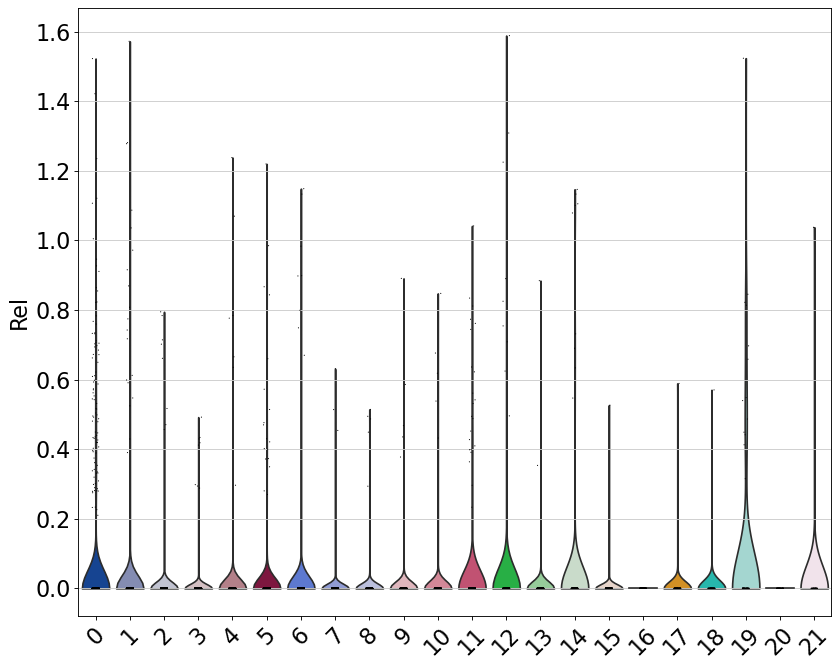

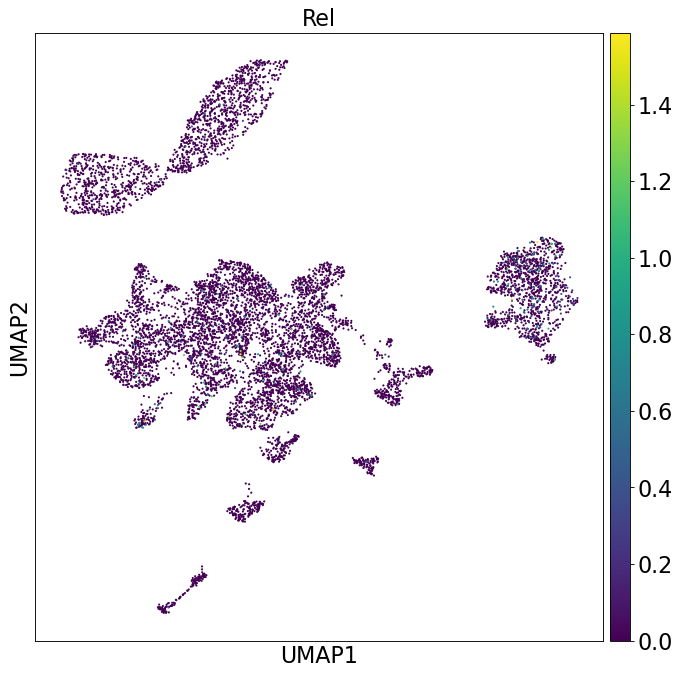

In [45]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Rel'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Rel')

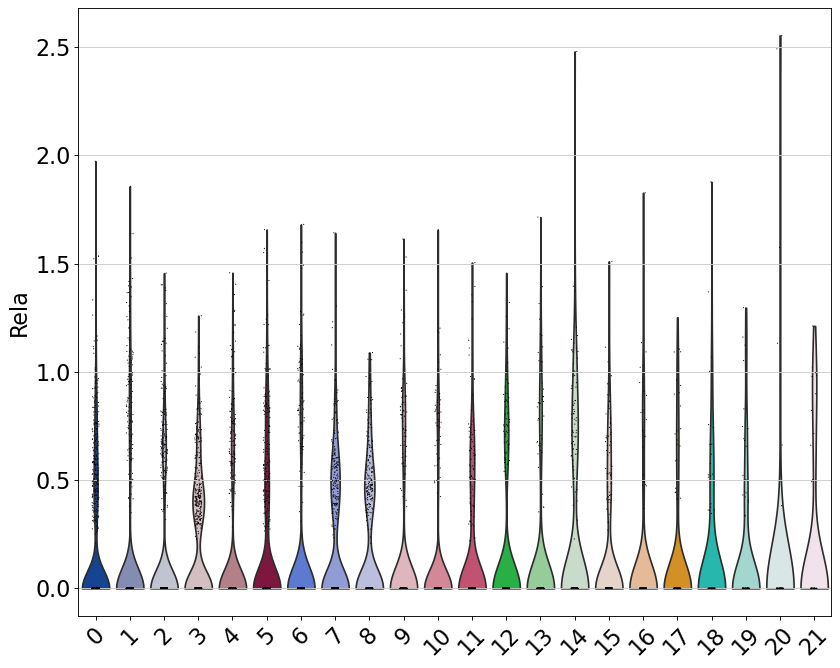

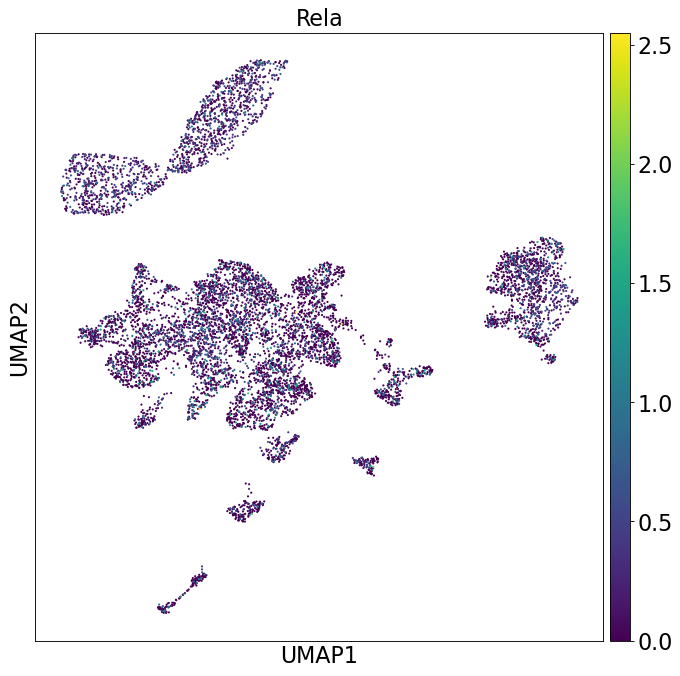

In [46]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Rela'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Rela')

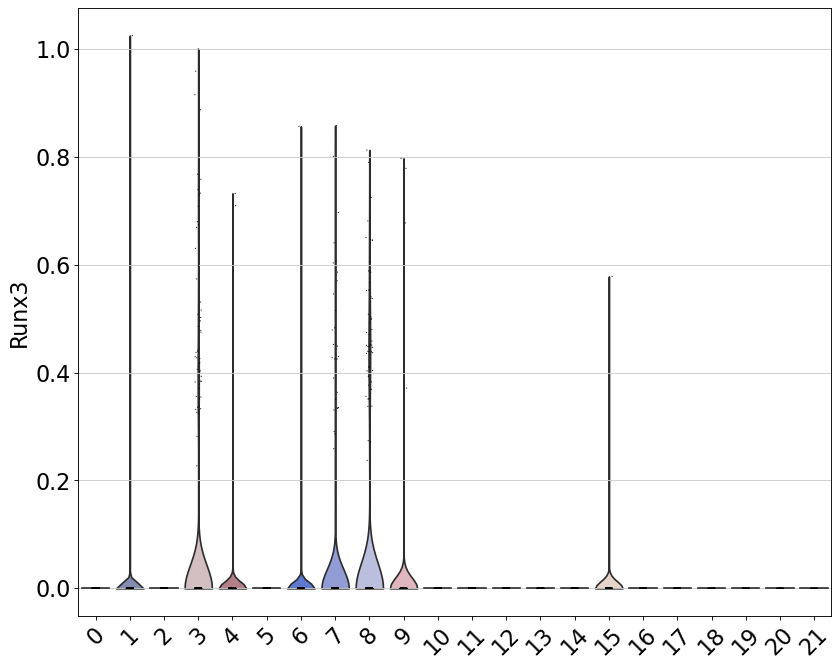

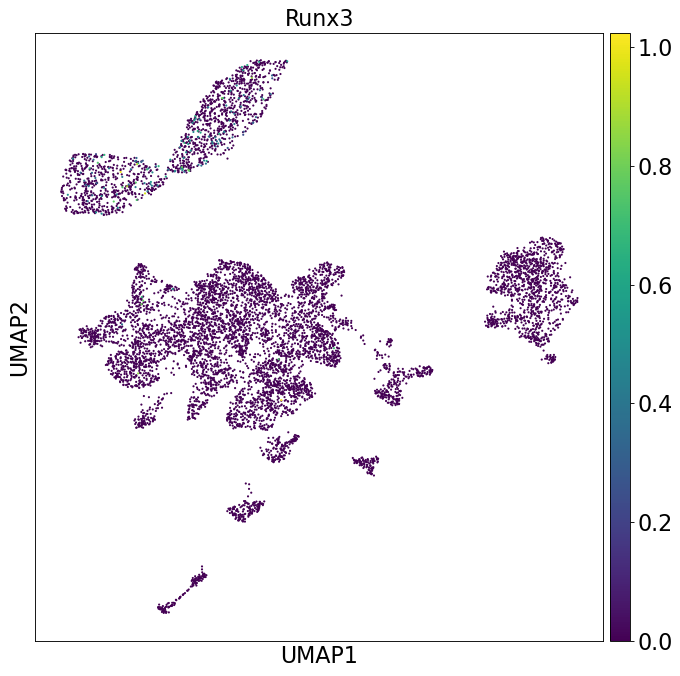

In [47]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Runx3'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Runx3')

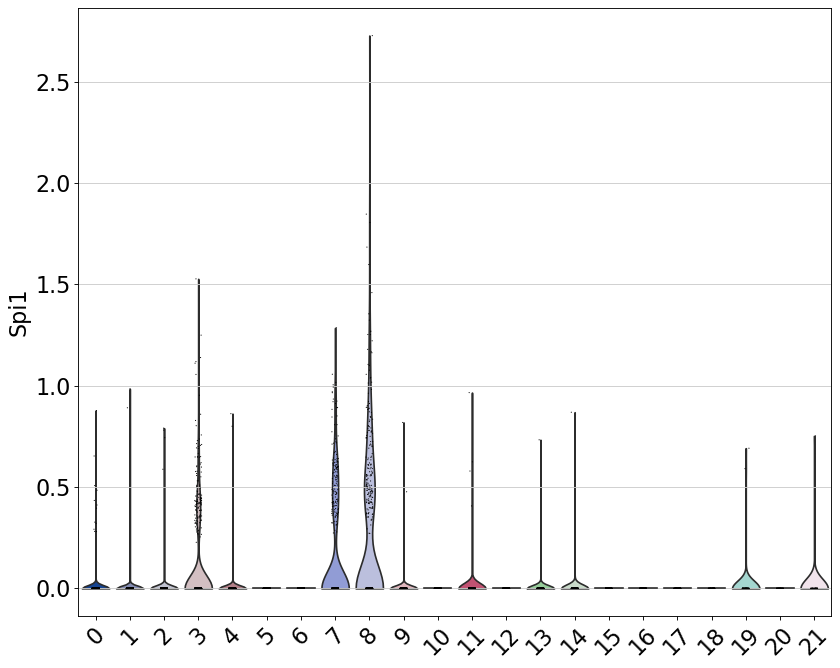

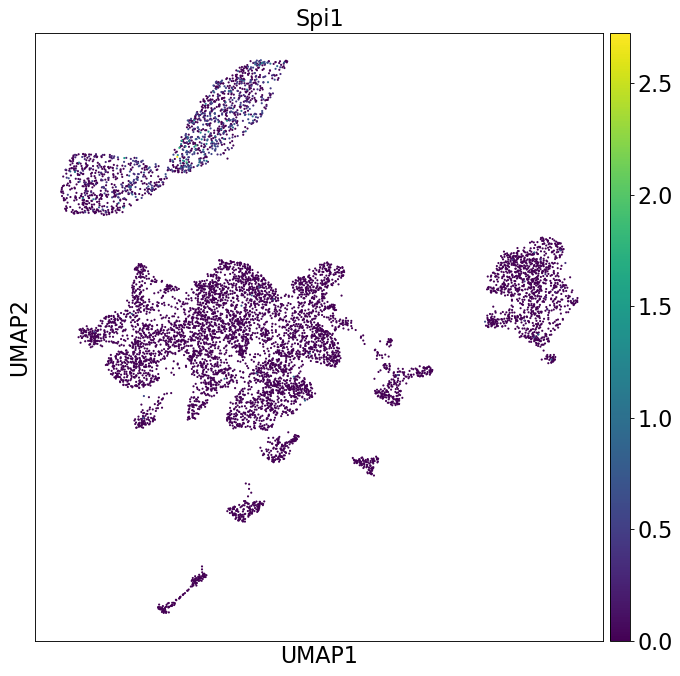

In [48]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Spi1'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Spi1')

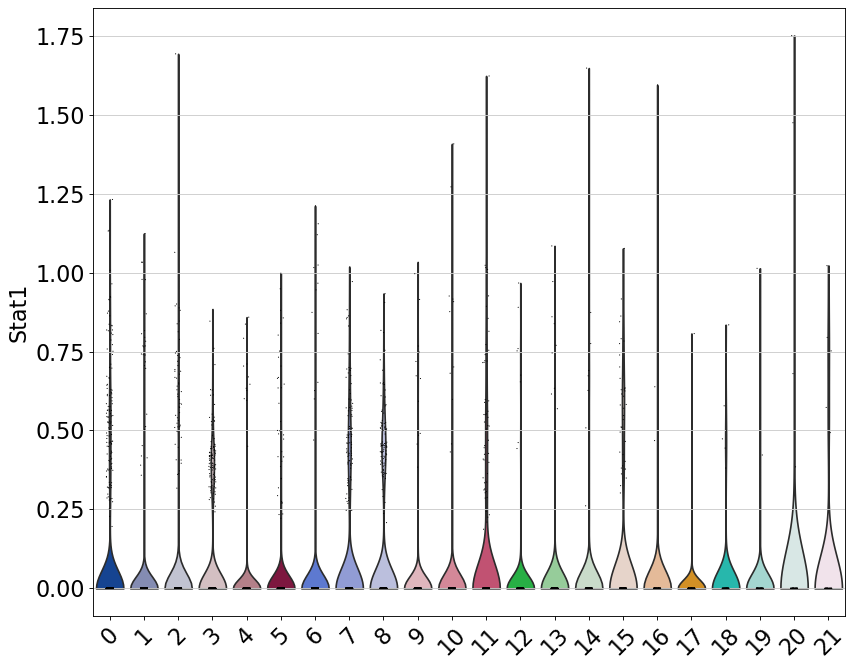

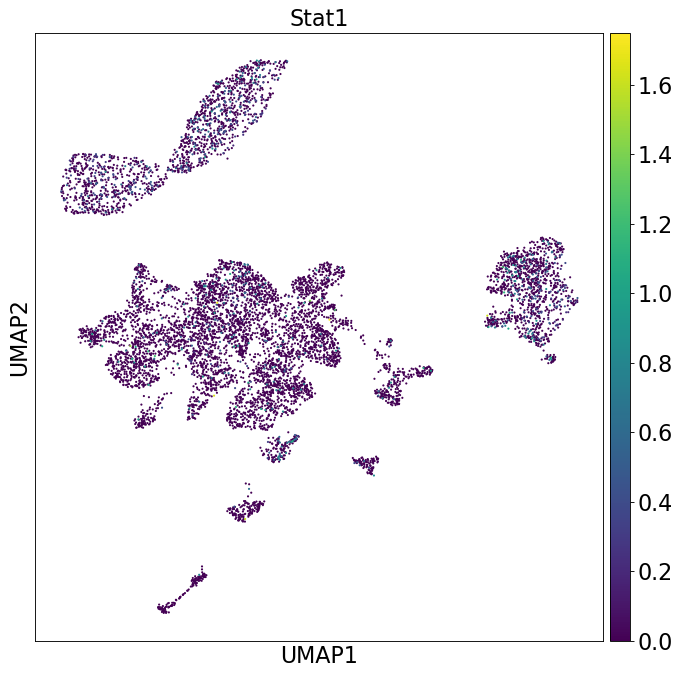

In [49]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Stat1'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Stat1')

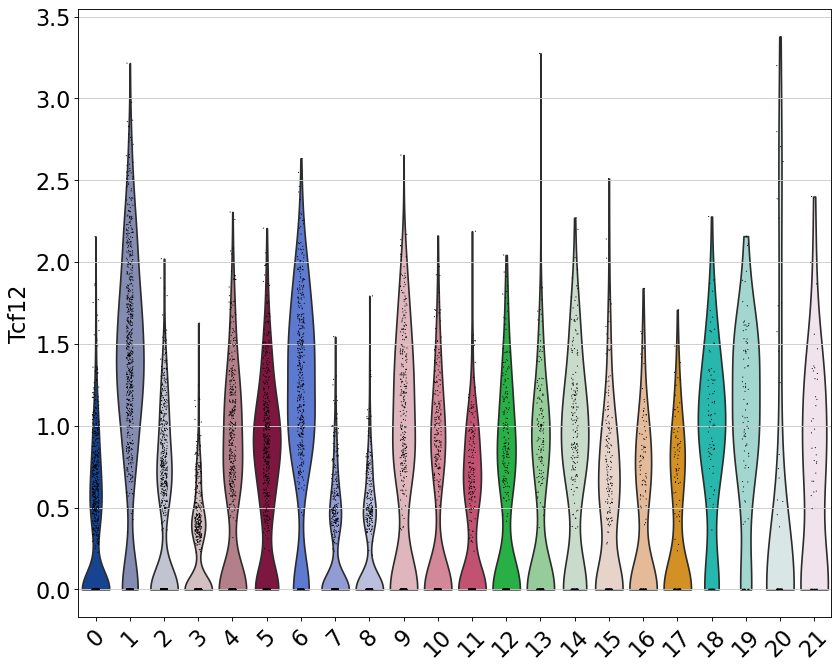

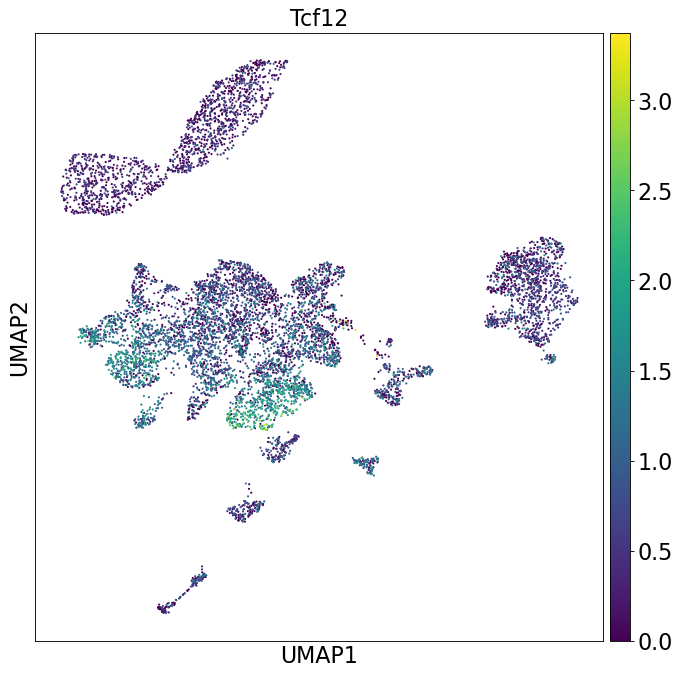

In [50]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Tcf12'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Tcf12')

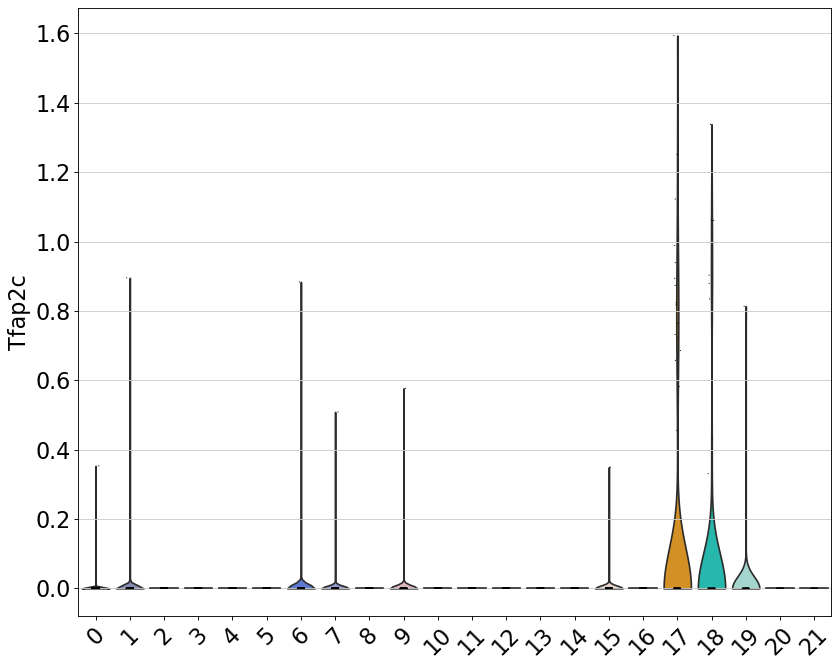

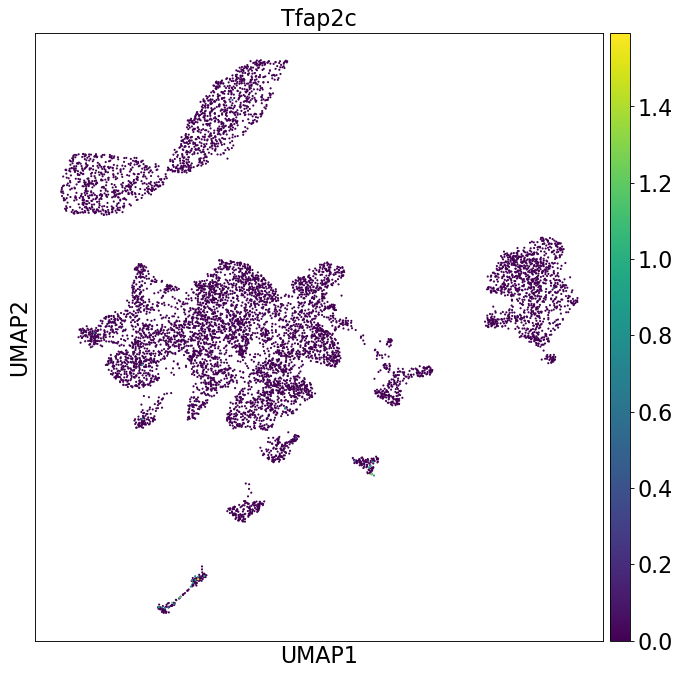

In [51]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
sc.pl.violin(adata, ['Tfap2c'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
sc.pl.umap(adata, color='Tfap2c')

In [52]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Tp53'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
#sc.pl.umap(adata, color='Tp53')

In [53]:
#sc.pl.violin(adata, ['Tagln'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Acta2'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Nes'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.violin(adata, ['Tp63'], groupby = 'leiden_1.0', rotation=45)
#sc.pl.umap(adata, color='leiden_1.0')
#sc.pl.umap(adata, color='Tagln')
#sc.pl.umap(adata, color='Acta2')
#sc.pl.umap(adata, color='Nes')
#sc.pl.umap(adata, color='Tp63')

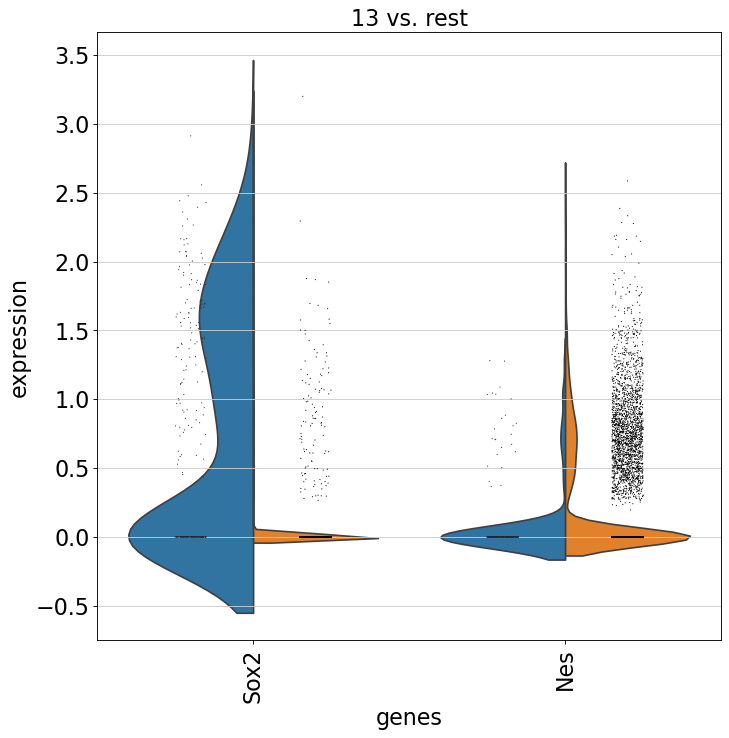

In [54]:
sc.pl.rank_genes_groups_violin(adata, groups='13', gene_names = ['Sox2','Nes'], key = "wilcoxon")

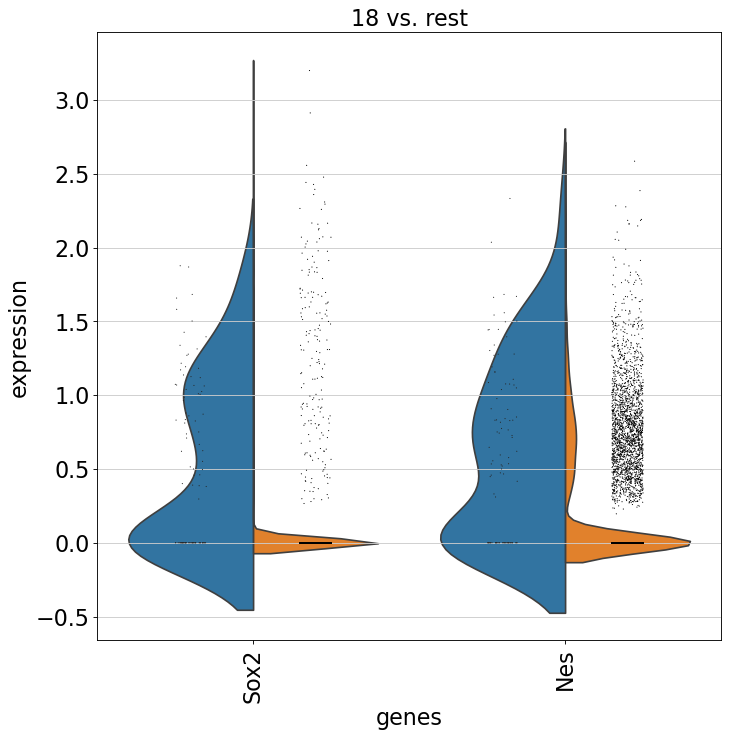

In [55]:
sc.pl.rank_genes_groups_violin(adata, groups='18', gene_names = ['Sox2','Nes'], key = "wilcoxon")

In [56]:
adata

AnnData object with n_obs × n_vars = 8058 × 2420
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'n_counts', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'leiden_0.2', 'leiden_0.4', 'leiden_0.6', 'leiden_0.8', 'leiden_1.0', 'leiden_1.2'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'doublet_info_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_0.2_colors', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'wilcoxon'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [57]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden_1.0', groups = ['18'], method='wilcoxon', use_raw=False)

ranking genes
/home/analysis/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:419: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


In [58]:
group18 = (sc.get.rank_genes_groups_df(adata, group="18")
          .set_index("names", drop=False))

In [59]:
group18.head()

,names,scores,logfoldchanges,pvals,pvals_adj
names,,,,,
Dpysl3,Dpysl3,15.561410,NaN,1.331325e-54,2.932152e-51
Cdh6,Cdh6,15.523031,NaN,2.423266e-54,2.932152e-51
Rbp1,Rbp1,15.093311,NaN,1.792170e-51,1.445684e-48
Plp1,Plp1,14.792626,NaN,1.634499e-49,9.888722e-47
Cthrc1,Cthrc1,14.350194,NaN,1.062401e-46,4.676193e-44


In [60]:
group18.to_csv('210324_group18.tsv', sep='\t', index = False)

In [61]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden_1.0', groups = ['18'], method='wilcoxon', use_raw=True)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:07)


In [62]:
group18_raw = (sc.get.rank_genes_groups_df(adata, group="18")
          .set_index("names", drop=False))

In [63]:
group18_raw.to_csv('210324_group18_raw.tsv', sep='\t', index = False)

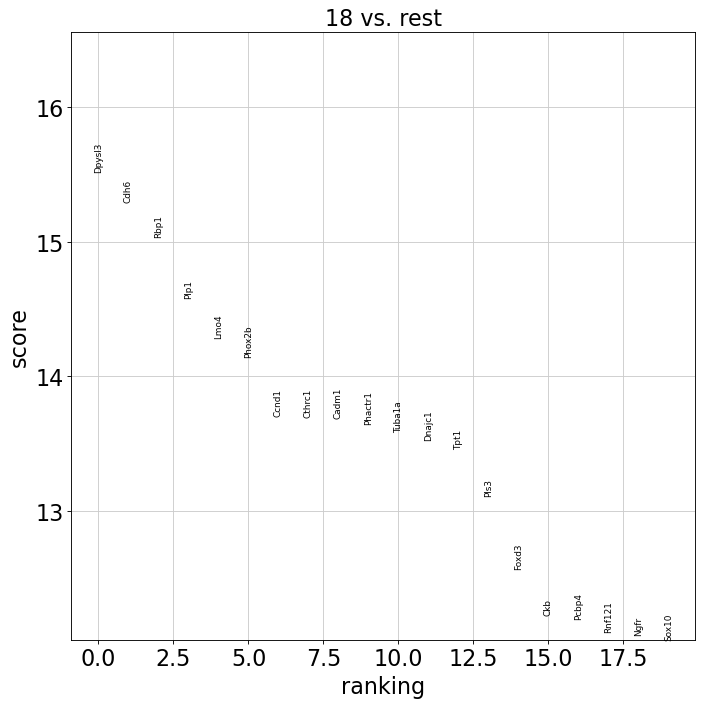

In [64]:
sc.pl.rank_genes_groups(adata, groups=['18'])

In [65]:
adata.write(results_file)

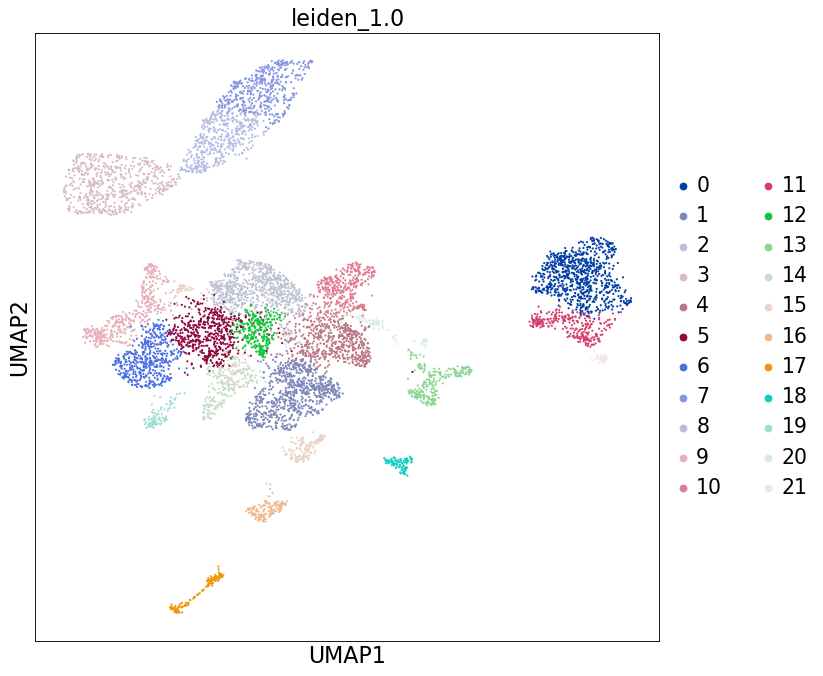

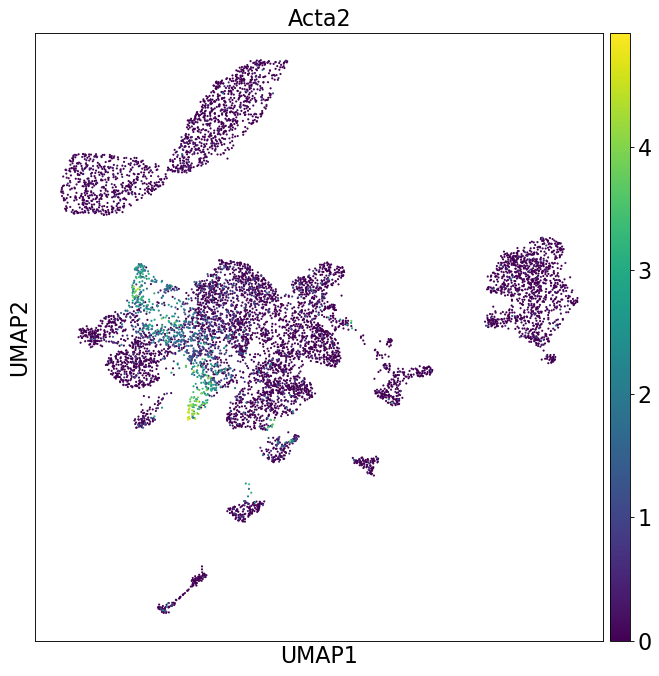

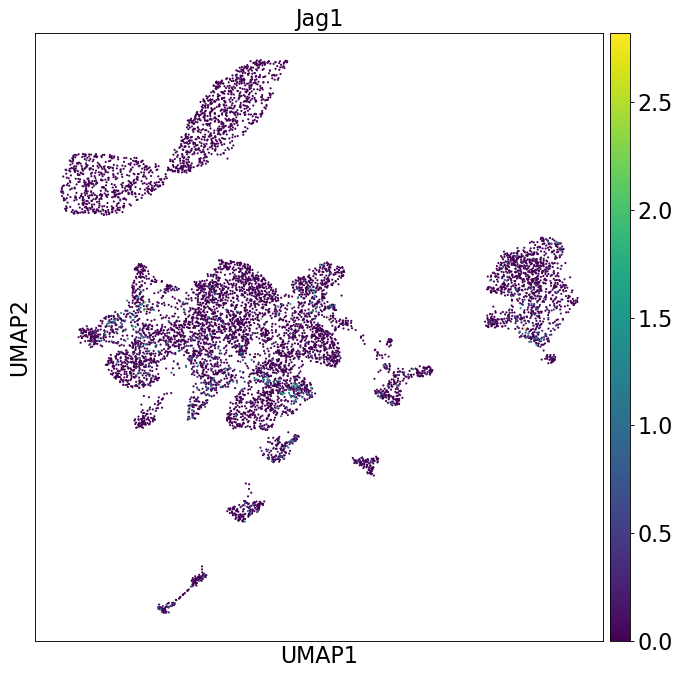

In [66]:
sc.pl.umap(adata, color='leiden_1.0')
sc.pl.umap(adata, color='Acta2')
sc.pl.umap(adata, color='Jag1')

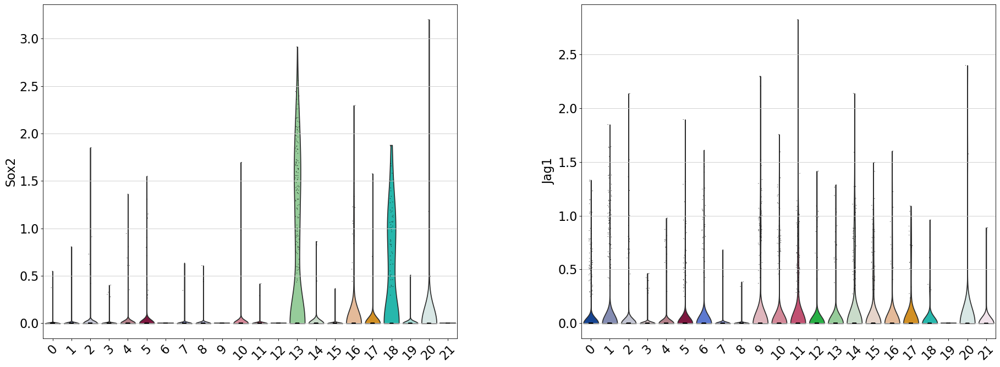

In [67]:
sc.pl.violin(adata, ['Sox2','Jag1'], groupby = 'leiden_1.0', rotation=45)

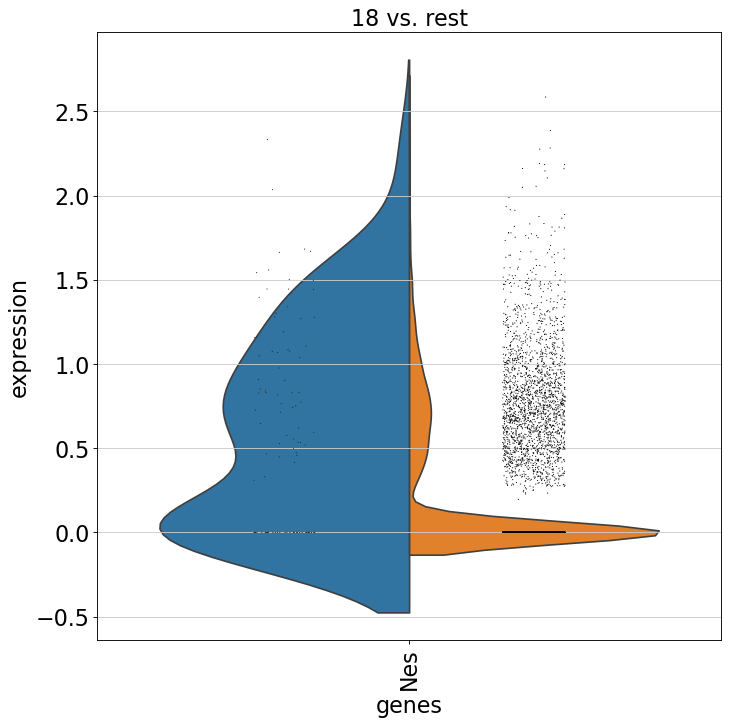

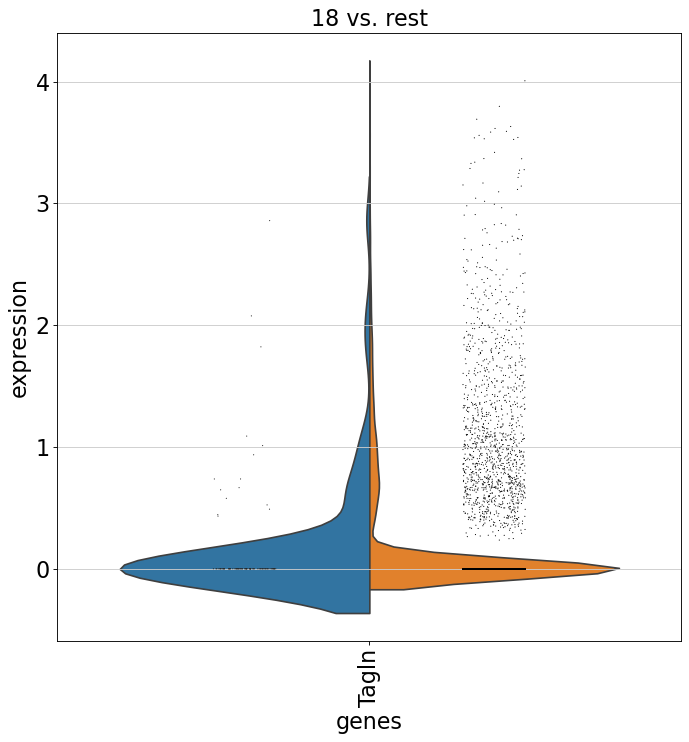

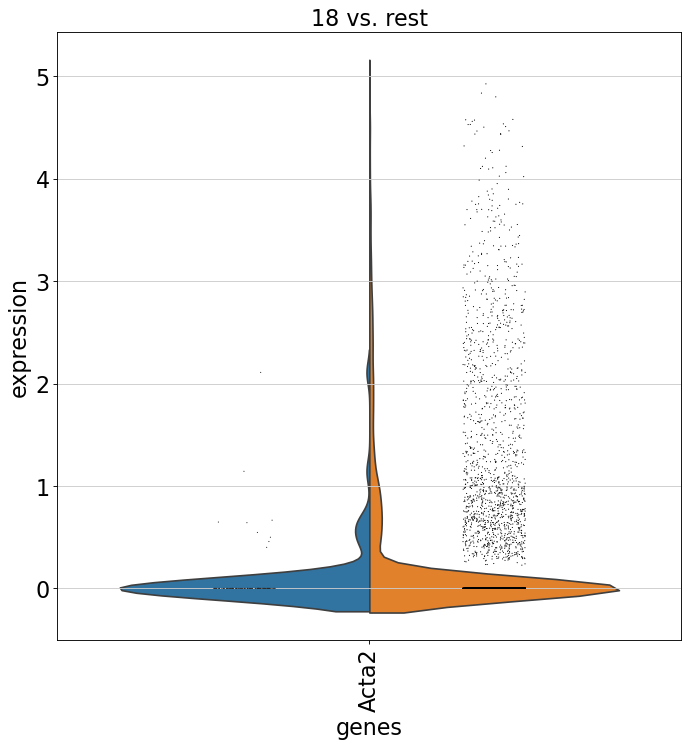

In [68]:
sc.pl.rank_genes_groups_violin(adata, groups='18', gene_names = ['Nes'], key = "wilcoxon")
sc.pl.rank_genes_groups_violin(adata, groups='18', gene_names = ['Tagln'], key = "wilcoxon")
sc.pl.rank_genes_groups_violin(adata, groups='18', gene_names = ['Acta2'], key = "wilcoxon")

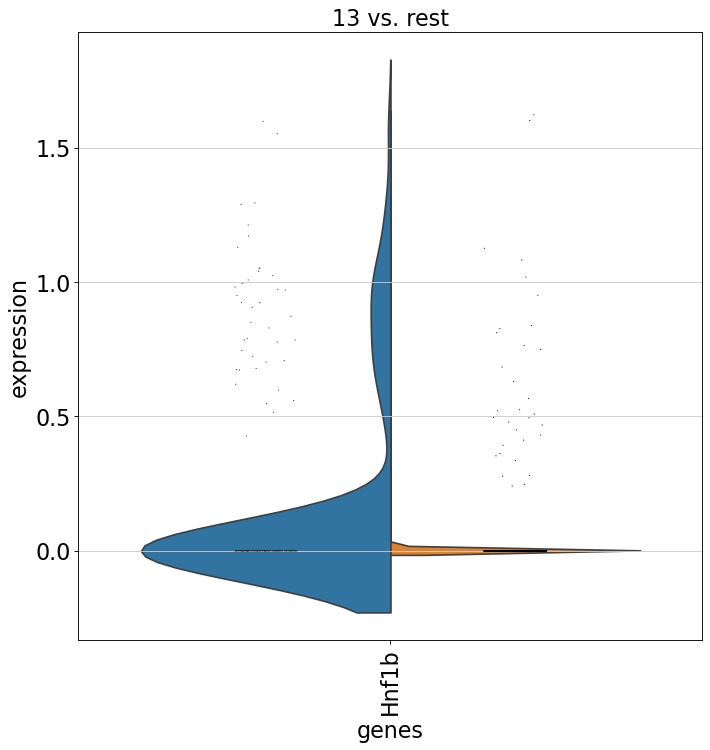

In [69]:
sc.pl.rank_genes_groups_violin(adata, groups='13', gene_names = ['Hnf1b'], key = "wilcoxon")

In [70]:
adata.write(result_file)

NameError: name 'result_file' is not defined